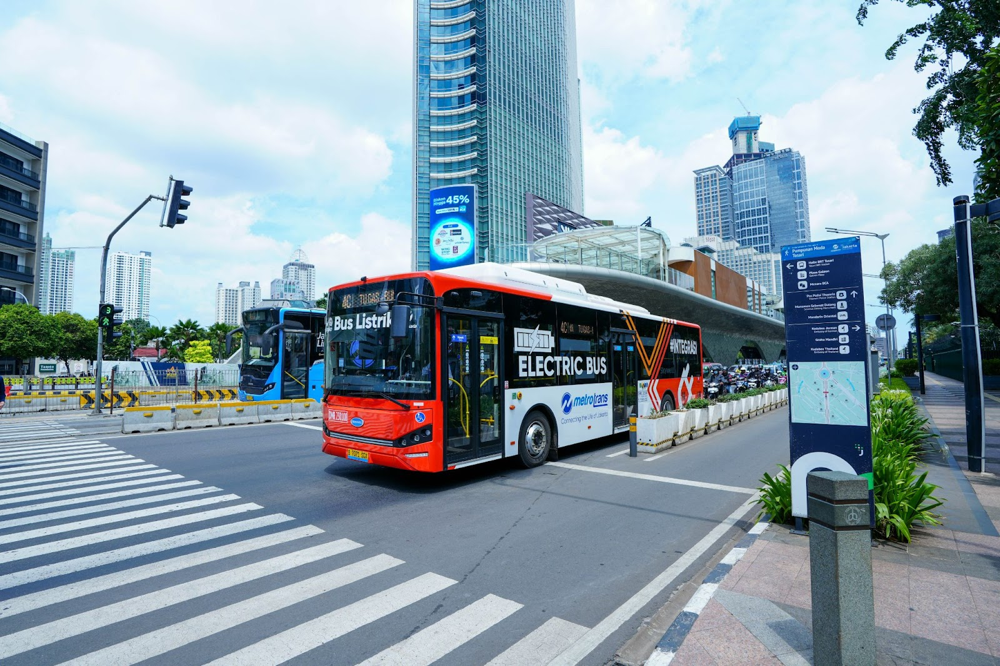

# Latar Belakang
Kebutuhan untuk mengurangi emisi karbon di Jakarta semakin mendesak, mengingat kota ini menghadapi tantangan serius terkait polusi udara. Salah satu penyumbang utama emisi karbon di wilayah perkotaan adalah transportasi darat, khususnya kendaraan bermotor berbahan bakar fosil. TransJakarta, sebagai salah satu moda transportasi publik andalan di Jakarta, berperan penting dalam upaya pengurangan emisi karbon melalui inovasi berupa pengadaan bus listrik.

Per 4 Maret 2024, TransJakarta mengoperasikan bus listrik di tujuh rute utama, yaitu:

- **1E**  : Pondok Labu–Blok M
- **4B**  : Stasiun Manggarai–Universitas Indonesia
- **4C**  : Pemuda Merdeka–Bundaran Senayan
- **4F**  : Pinang Ranti–Pulo Gadung
- **6D**  : Stasiun Tebet–Bundaran Senayan
- **7A**  : Kampung Rambutan–Lebak Bulus
- **D21** : Universitas Indonesia–Lebak Bulus

Namun, dengan keterbatasan jumlah bus listrik yang tersedia, penting untuk memastikan bahwa tujuh rute yang dipilih oleh TransJakarta adalah rute yang tepat untuk memberikan dampak maksimal dalam upaya pengurangan emisi karbon. Evaluasi lebih lanjut diperlukan untuk menilai apakah alokasi armada bus listrik pada rute-rute tersebut sudah sesuai, terutama jika dilihat dari tingkat emisi karbon yang dihasilkan.

# Pernyataan Masalah
Sebagai bagian dari upaya pengurangan emisi karbon melalui transportasi publik, TransJakarta telah memilih tujuh rute utama untuk dioperasikan menggunakan bus listrik. Namun, muncul pertanyaan:

**Apakah TransJakarta sudah tepat dalam memilih tujuh rute tersebut untuk penggunaan bus listrik?**

Pertanyaan ini penting mengingat keterbatasan jumlah bus listrik dan sumber daya yang tersedia. Rute-rute yang dipilih harus mampu memberikan dampak maksimal dalam mengurangi emisi karbon, melayani jumlah penumpang yang signifikan, dan relevan dengan kondisi lingkungan di sepanjang rute tersebut.

Evaluasi terhadap rute-rute ini diperlukan untuk memastikan bahwa implementasi bus listrik dilakukan secara strategis dan mampu mendukung tujuan utama TransJakarta, yaitu pengurangan emisi karbon, peningkatan kualitas udara, dan keberlanjutan sistem transportasi publik di Jakarta.

# Tujuan Analisis
Dalam konteks evaluasi penggunaan bus listrik pada tujuh rute utama TransJakarta, tujuan dari analisis ini adalah sebagai berikut:

- Mengoptimalkan distribusi armada bus listrik berdasarkan prioritas pengurangan emisi karbon.
- Mengidentifikasi rute-rute yang masih menggunakan bus berbahan bakar bensin dan memiliki potensi untuk dialihkan ke armada bus listrik secara efektif.
- Menganalisis waktu operasional tertinggi dan jarak tempuh rata-rata per rute, untuk memastikan efisiensi implementasi bus listrik.

Tujuan ini diharapkan dapat membantu TransJakarta dalam mengevaluasi pemilihan rute yang tepat dan memberikan dampak maksimal terhadap pengurangan emisi karbon di Jakarta.

# Data
Untuk menjawab pertanyaan di atas, kita akan menganalisa data yang sudah dikumpulkan oleh perusahaan Transjakarta. Dataset tersebut dapat diakses [pada link ini!](https://www.kaggle.com/datasets/dikisahkan/transjakarta-transportation-transaction/data)

In [3790]:
import pandas as pd
import numpy as np
import seaborn as sns  # Library untuk visualisasi data
import matplotlib.pyplot as plt  # Library untuk membuat grafik
import missingno as msno
import warnings  # Library untuk pengaturan peringatan
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows',100)

Dataset ini adalah simulasi data transaksi TransJakarta yang mencakup rute, lokasi, waktu perjalanan, metode pembayaran, dan profil penumpang. Data ini dibuat untuk analisis simulasi. Dalam dataset Transjakarta ini terdapat **22** kolom yang berisikan:

- `transID`: ID unik untuk setiap transaksi.
- `payCardID`: Identifikasi utama pelanggan, berupa kartu yang digunakan untuk masuk dan keluar.
- `payCardBank`: Nama bank penerbit kartu pelanggan.
- `payCardName`: Nama pelanggan yang tercantum pada kartu.
- `payCardSex`: Jenis kelamin pelanggan yang tercantum pada kartu.
- `payCardBirthDate`: Tahun kelahiran pelanggan.
- `corridorID`: ID Koridor/Rute sebagai kunci pengelompokan rute.
- `corridorName`: Nama Koridor/Rute, mencantumkan titik awal dan akhir untuk setiap rute.
- `direction`: Arah rute, 0 untuk berangkat, 1 untuk kembali.
- `tapInStops`: ID Halte Tap In (masuk) untuk mengidentifikasi nama halte.
- `tapInStopsName`: Nama Halte Tap In (masuk) tempat pelanggan melakukan tap in.
- `tapInStopsLat`: Latitude lokasi Halte Tap In.
- `tapInStopsLon`: Longitude lokasi Halte Tap In.
- `stopStartSeq`: Urutan halte, halte ke-1, halte ke-2, dan seterusnya. Terkait dengan arah.
- `tapInTime`: Waktu pelanggan melakukan tap in. Berisi tanggal dan waktu.
- `tapOutStops`: ID Halte Tap Out (keluar) untuk mengidentifikasi nama halte.
- `tapOutStopsName`: Nama Halte Tap Out (keluar) tempat pelanggan melakukan tap out.
- `tapOutStopsLat`: Latitude lokasi Halte Tap Out.
- `tapOutStopsLon`: Longitude lokasi Halte Tap Out.
- `stopEndSeq`: Urutan halte, halte ke-1, halte ke-2, dan seterusnya. Terkait dengan arah.
- `tapOutTime`: Waktu pelanggan melakukan tap out. Berisi tanggal dan waktu.
- `payAmount`: Jumlah yang dibayar pelanggan. Beberapa gratis, beberapa tidak.

Berikut untuk 5 baris teratas dan terbawah dari dataset **Transjakarta**:  

In [3793]:
transjakarta = pd.read_csv('Transjakarta.csv')
display(transjakarta.head(), transjakarta.tail())

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,...,106.84402,7,2023-04-03 05:21:44,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500.0
1,LGXO740D2N47GZ,4885331907664776,dki,Gandi Widodo,F,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,...,106.83302,13,2023-04-03 05:42:44,B03307P,Sampoerna Strategic,-6.217152,106.81892,21.0,2023-04-03 06:40:01,3500.0
2,DJWR385V2U57TO,4996225095064169,dki,Emong Wastuti,F,1992,R1A,Pantai Maju - Kota,0.0,B00499P,...,106.81435,38,2023-04-03 05:59:06,B04962P,Simpang Kunir Kemukus,-6.133731,106.81475,39.0,2023-04-03 06:50:55,3500.0
3,JTUZ800U7C86EH,639099174703,flazz,Surya Wacana,F,1978,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,...,106.93526,23,2023-04-03 05:44:51,B03090P,Raya Penggilingan,-6.183068,106.93194,29.0,2023-04-03 06:28:16,3500.0
4,VMLO535V7F95NJ,570928206772,flazz,Embuh Mardhiyah,M,1982,12,Tanjung Priok - Pluit,0.0,P00239,...,106.88900,5,2023-04-03 06:17:35,P00098,Kali Besar Barat,-6.135355,106.81143,15.0,2023-04-03 06:57:03,3500.0


,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount
37895,ZWEC949B8Q87QG,4685818286724028395,brizzi,Kamila Mahendra,F,2004,6B,Ragunan - MH Thamrin via Semanggi,1.0,P00261,...,106.82309,2,2023-04-21 18:18:37,P00228,SMK 57,-6.290967,106.82365,13.0,2023-04-21 19:55:49,3500.0
37896,YHHK837P6Y95GN,6502902290603767,dki,Titi Siregar,M,1974,9N,Pinang Ranti - Pramuka,1.0,P00064,...,106.88116,1,2023-04-18 21:52:31,P00179,Pinang Ranti,-6.291075,106.88634,2.0,2023-04-18 22:28:22,3500.0
37897,YXPP627N4G95HO,213159426675861,emoney,drg. Zahra Nashiruddin,F,1976,1T,Cibubur - Balai Kota,1.0,B02873P,...,106.81676,12,2023-04-04 10:29:47,B00226P,Buperta Cibubur,-6.370321,106.89628,14.0,2023-04-04 13:27:25,20000.0
37898,RGVK175U2U98UV,377840859133591,emoney,Ana Agustina,M,1976,JAK.13,Tanah Abang - Jembatan Lima,1.0,B02505P,...,106.80954,33,2023-04-15 19:59:26,B01787P,JPO Blok G,-6.188861,106.81135,34.0,2023-04-15 20:27:50,0.0
37899,FMZZ963S4B68ZP,501862539795,flazz,drg. Leo Najmudin,F,1985,13,Ciledug - Tendean,0.0,P00001,...,106.74786,2,2023-04-12 21:08:12,P00106,Kebayoran Lama,-6.238340,106.77752,7.0,2023-04-12 21:34:53,3500.0


# Data Understanding & Data Cleaning

Sebelum memulai analisis data, langkah awal yang penting adalah melakukan proses *data understanding* dan *data cleaning*. *Data understanding* berfokus pada pemahaman konteks dataset, termasuk arti setiap kolom, hubungan antar atribut, distribusi data, dan pola-pola signifikan yang dapat mendukung analisis lebih lanjut. Setelah memahami data, langkah berikutnya adalah *data cleaning*, yang mencakup identifikasi pola-pola awal, penanganan masalah seperti nilai yang hilang, duplikasi, anomali, atau *outlier* yang dapat memengaruhi keakuratan hasil analisis. Kedua langkah ini memastikan data yang digunakan memiliki kualitas tinggi dan relevan untuk analisis.

In [3796]:
print()
print(f'\033[1mJumlah baris dan kolom di dataset Transjakarta adalah {transjakarta.shape}\033[0m')
print()
transjakarta.info()


Jumlah baris dan kolom di dataset Transjakarta adalah (37900, 22)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37900 entries, 0 to 37899
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   transID           37900 non-null  object 
 1   payCardID         37900 non-null  int64  
 2   payCardBank       37900 non-null  object 
 3   payCardName       37900 non-null  object 
 4   payCardSex        37900 non-null  object 
 5   payCardBirthDate  37900 non-null  int64  
 6   corridorID        36643 non-null  object 
 7   corridorName      35970 non-null  object 
 8   direction         37900 non-null  float64
 9   tapInStops        36687 non-null  object 
 10  tapInStopsName    37900 non-null  object 
 11  tapInStopsLat     37900 non-null  float64
 12  tapInStopsLon     37900 non-null  float64
 13  stopStartSeq      37900 non-null  int64  
 14  tapInTime         37900 non-null  object 
 15  tapOutStops       3

In [3797]:
display(transjakarta.describe(), transjakarta.describe(include='object'))

,payCardID,payCardBirthDate,direction,tapInStopsLat,tapInStopsLon,stopStartSeq,tapOutStopsLat,tapOutStopsLon,stopEndSeq,payAmount
count,3.790000e+04,37900.000000,37900.000000,37900.000000,37900.000000,37900.000000,36556.000000,36556.000000,36556.000000,36893.000000
mean,4.250060e+17,1990.089314,0.500633,-6.214838,106.841554,13.572480,-6.214651,106.841233,21.219909,2699.712683
std,1.321699e+18,13.051482,0.500006,0.057911,0.060369,12.237623,0.059022,0.060999,13.800689,4212.225592
min,6.040368e+10,1946.000000,0.000000,-6.394973,106.614730,0.000000,-6.394973,106.614730,1.000000,0.000000
25%,1.800442e+14,1982.000000,0.000000,-6.245863,106.803470,4.000000,-6.247225,106.801750,11.000000,0.000000
50%,3.507947e+15,1990.000000,1.000000,-6.214587,106.834830,10.000000,-6.214718,106.834580,18.000000,3500.000000
75%,4.699023e+15,2001.000000,1.000000,-6.175528,106.882270,19.000000,-6.174736,106.883030,29.000000,3500.000000
max,4.997694e+18,2012.000000,1.000000,-6.089429,107.023950,68.000000,-6.091746,107.023660,77.000000,20000.000000


,transID,payCardBank,payCardName,payCardSex,corridorID,corridorName,tapInStops,tapInStopsName,tapInTime,tapOutStops,tapOutStopsName,tapOutTime
count,37900,37900,37900,37900,36643,35970,36687,37900,37900,35611,36556,36556
unique,37900,6,1993,2,221,216,2570,2602,37079,2230,2248,35908
top,EIIW227B8L34VB,dki,Fathonah Saefullah,F,1T,Cibubur - Balai Kota,P00170,Penjaringan,2023-04-25 06:23:00,P00016,BKN,2023-04-10 19:10:15
freq,1,18743,80,20157,400,391,236,243,3,306,316,3


# Identifikasi Jumlah Data Unik Tiap Kolom Pada Data

In [3799]:
pd.set_option('display.max_colwidth', None)
# data uni di tiap kolom
listItem = []
for col in transjakarta.columns :
    listItem.append( [col, transjakarta[col].nunique(), transjakarta[col].unique()])

dfDesc = pd.DataFrame(columns=['Column Name', 'Number of Unique', 'Unique Sample'],
                     data=listItem)
dfDesc

,Column Name,Number of Unique,Unique Sample
0,transID,37900,"[EIIW227B8L34VB, LGXO740D2N47GZ, DJWR385V2U57TO, JTUZ800U7C86EH, VMLO535V7F95NJ, DDES630K2F80KC, HEMW326B9N91TV, XTKE052E5E87LN, OIHS248V7S72EB, ERXO372B2H63RB, CLWK627W2M22WO, IIEK980X1O23NZ, OPLW560U3S06UG, XESX233R4U46DN, LZFD368Q3E81HJ, KLUN542I2F21PI, XDMP644Z5Y29DB, CUPO258C0D42PY, SBPQ144H4S45RA, ZYRL615G4C05RD, MEFW094B7A84RS, ZJVI960B9I42DA, RJPK085I1K65HR, TFIO518N2X54UT, SYLN486U0E02TA, BECP746A8C28NV, KYNP204W3G29VA, MSFD430X8W13TO, MKND874X1D96HF, LFYJ535S2I30DP, TCKQ601Q5O01BC, KQIA358G2N38CX, RANO576G1J87EO, NZCE828E4J23AW, OFPJ170M5O75AP, LKXU174O1E59EP, AXTN077R7Z77JM, WQXL397G5U61OY, RLLZ887W3V14WZ, JJEK861K6E37KF, UANX737M9L25GI, VUWZ891M7I57EB, CXLW459Z3A28RD, AQPU510X2X44PT, BRUT293K1O98GA, MMEX885R3T18QL, UNFK619O2R74DX, FTGY161E2O14MG, ELVU605Z3W26IF, KPDA909R2T72GD, GIHF067H1Y81IV, IXJW013G5W79VX, PKAM574R5S22UG, IQBJ843C4G34DE, SRIX686S0S08SW, MLTY652D7F29HW, NICD824U6H93DE, YEOK544W1J67OX, OPNL705D9K64FN, KHKM512K0T88LD, RHUT145C1U25ZY, TWAK265Z0M88QR, JQIF022K9P74RM, MQCN972F9X71NY, KINJ335N6L86YT, TDIY341Y5S79UU, TFRA396G6W78PD, GXOP506G9B61EP, XESL868N6A66XN, IVHH403J9T51JH, OTGH855B8A29BP, YJMS457L2O20JF, NNAE999Q4V92XM, UCMI767D7M79GS, ZHFN555D9L05LU, WHTZ386I9S44YF, VHUC320U1S58CB, DBWI728C0M55ND, HHCJ093F0W41XK, JUNS207R4F95UA, LFIW578V8Y12XO, GYVC538M6B25WO, QRFR658M6P01AH, TKQW976R2D32RY, PCGM443G2W62OB, PEGV120E5W96OH, BUQT197K3D65PN, UNSO267V8F26WP, RHCN069U6G42WD, QMHC825R0K38KM, WGRY331M3O87VE, TKRV681O2S46RW, ELFD362R2U94NT, YYXK265F5N59SE, ZGJG301G9Z71AR, KNSE319Q1P35CC, RMJF585F2W51BQ, KFYK655N1H73XS, WTBE175B2A58NC, SVRH922T8G79FY, ...]"
1,payCardID,2000,"[180062659848800, 4885331907664776, 4996225095064169, 639099174703, 570928206772, 2251412124634980, 213155822653833, 3587341902618993, 6510013988638519, 3580401035990896, 5541851157087967, 347204308990092, 3536759468239783, 6575130739600630, 4056836188316, 4532407180860336, 4556326832434362836, 4969284110642, 502034641014, 5430018591726410, 378872365541693, 343851798729291, 676293109036, 213191293100137, 2295833910329055, 4968156435384914, 676367323901, 4384653483539395, 213155309116759, 4682220924642, 3589380857722689, 4394677357168120, 4905734029265594, 379334845079777, 346910704516122, 2247096843683316, 675990206087, 639040388584, 4947438345710982, 3539535695881465, 574726750023, 344303671677311, 3544931989278653, 4017802962833960, 5465310774429054, 347394043585982, 4723250872219869, 3545499820365948, 2718070346782735, 342531623551844, 349944373495091, 4428582927102421723, 566171543168, 213121690546749, 3527853482331808, 5542490449138301, 4380875529452127, 4172238784006231, 340065298083181, 4268640600849949, 4290559479079, 213155263532652, 4294484188649274, 180057903365395, 3551174827324245, 340858239719917, 3569562588766630, 180016859215889, 373945281501952, 5134532253940704, 3549158005951908, 379764016867073, 4189640459822695962, 4766007569419196, 3576239635494729, 587887634588, 567286069354, 4097122165824, 378851219912235, 180022972730457, 2237440645700724, 6011162006507240, 4730280883020443501, 3505707886664931, 4450403105752326, 4074114259011835374, 4000041838802, 4112330548313, 30583455954585, 3537543297101185, 2720484776954605, 3570422408611549, 2291402671071407, 676172975739, 180020791350481, 502072062834, 30385017224303, 6590854673757012, 4963710913075879668, 213104805015669, ...]"
2,payCardBank,6,"[emoney, dki, flazz, online, brizzi, bni]"
3,payCardName,1993,"[Bajragin Usada, Gandi Widodo, Emong Wastuti, Surya Wacana, Embuh Mardhiyah, Tirta Siregar, R. Devi Hariyah, S.T., Darmanto Rajasa, Cagak Maheswara, S.Sos, T. Dadap Pradana, M.Ak, Oskar Widiastuti, S.Farm, R.M. Labuh Laksmiwati, Shakila Maryadi, Danuja Usada, Nadine Utami, H. Lutfan Nurdiyanti, Sari Nababan, Hj. Ophelia Haryanti, S.Sos, Adikara Kurniawan, S.Sos, Karna Waskita, Aslijan Irawan, Garang Utama, Fathonah Saefullah, Darman Purwanti, Taufik Farida, Martana Suartini, Eluh Nugroho, Cut Hana Maulana,

# Duplicate Data

In [3801]:
transjakarta.duplicated().sum()

0

Tidak ada data yang *duplicate* dari dataset Transjakarta ini.

# *Missing Value*

In [3808]:
missing_values = transjakarta.isna().sum()

missing_percentage = (missing_values / len(transjakarta) * 100).round(2)

missing_summary = pd.DataFrame({
    'Column Name': transjakarta.columns,
    'Missing Values': missing_values,
    'Percentage (%)': missing_percentage
})
missing_summary

,Column Name,Missing Values,Percentage (%)
transID,transID,0,0.00
payCardID,payCardID,0,0.00
payCardBank,payCardBank,0,0.00
payCardName,payCardName,0,0.00
payCardSex,payCardSex,0,0.00
payCardBirthDate,payCardBirthDate,0,0.00
corridorID,corridorID,1257,3.32
corridorName,corridorName,1930,5.09
direction,direction,0,0.00
tapInStops,tapInStops,1213,3.20


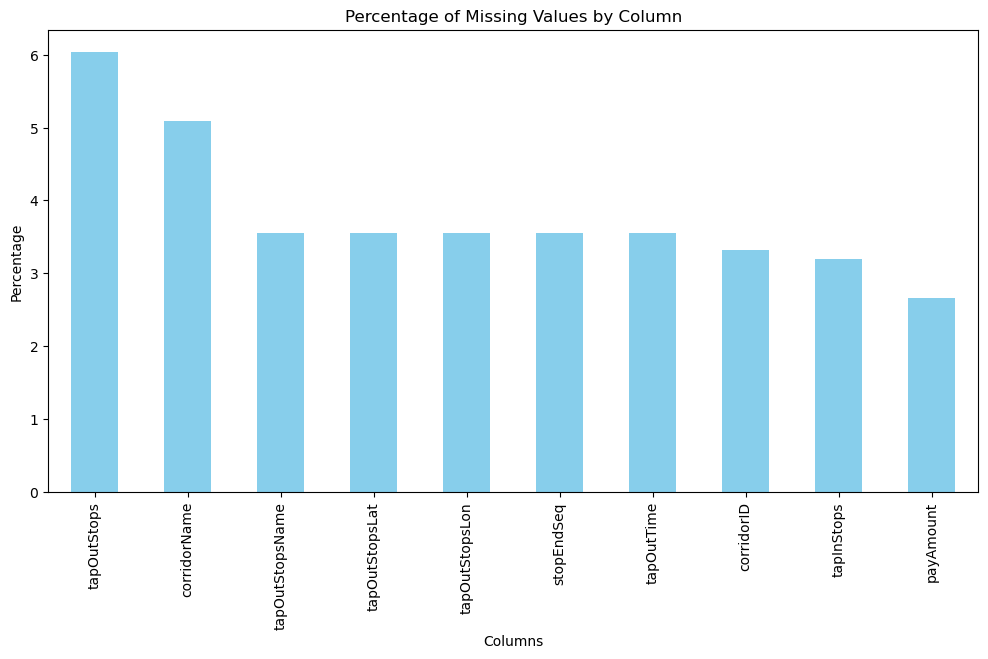

In [3810]:
missing_values = transjakarta.isna().sum()
missing_percentage = (missing_values / len(transjakarta)) * 100

# Barplot
missing_percentage[missing_percentage > 0].sort_values(ascending=False).plot(kind='bar', figsize=(12, 6), color='skyblue')
plt.title('Percentage of Missing Values by Column')
plt.ylabel('Percentage')
plt.xlabel('Columns')
plt.show()

Disini kami menggunakan *missingno* untuk melihat visualisasi pola missing values dalam dataset, termasuk kolom yang memiliki nilai kosong, proporsinya, dan hubungan antar kolom terkait nilai yang hilang.

<Axes: >

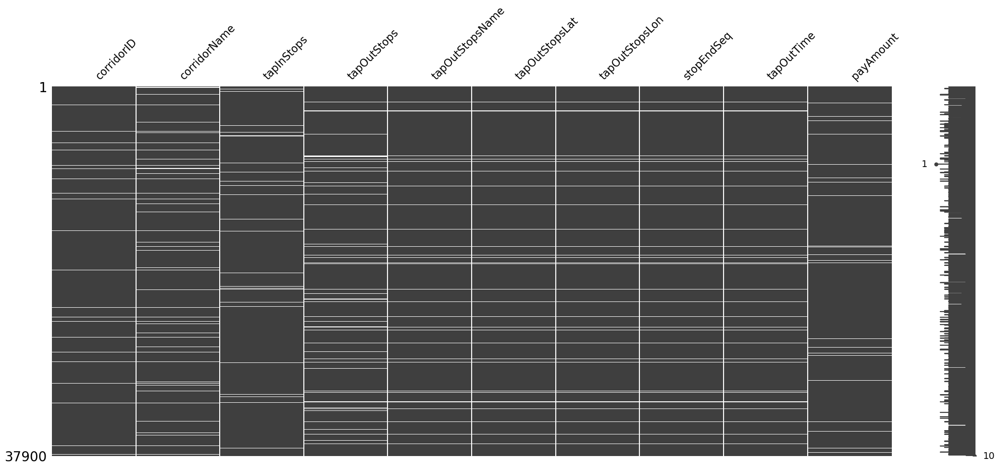

In [3813]:
msno.matrix(transjakarta[['corridorID', 'corridorName', 'tapInStops', 'tapOutStops', 'tapOutStopsName', 'tapOutStopsLat', 'tapOutStopsLon',
'stopEndSeq', 'tapOutTime', 'payAmount']])

<Axes: >

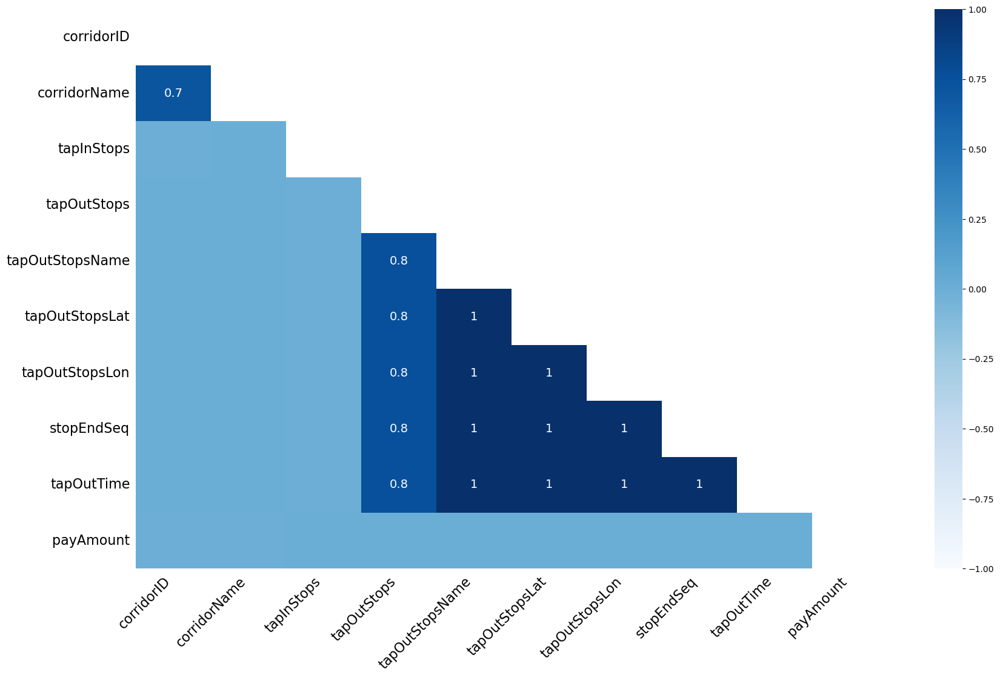

In [3815]:
msno.heatmap(transjakarta[['corridorID', 'corridorName', 'tapInStops', 'tapOutStops', 'tapOutStopsName', 'tapOutStopsLat', 'tapOutStopsLon',
'stopEndSeq', 'tapOutTime', 'payAmount']], cmap='Blues')

**Secara Garis Besar**
- Kolom `corridorID` dan `corridorName`:
Kedua kolom ini menunjukkan adanya korelasi dalam sebaran *missing values*. Jika salah satu kolom memiliki nilai kosong, kolom lainnya juga memiliki nilai kosong. Hal ini mengindikasikan hubungan langsung antara kedua kolom.
- Kolom `tapOutStops`, `tapOutStopsName`, `tapOutStopsLat`, `tapOutStopsLon`, `stopEndSeq`, dan `tapOutTime`:
*Missing values* pada kolom-kolom ini saling berkaitan. Jika satu kolom kehilangan data, kolom lainnya dalam grup ini juga kehilangan data. Hal ini menunjukkan pola yang sama di antara kolom-kolom tersebut.
- Kolom `tapOutStopsName`, `tapOutStopsLat`, `tapOutStopsLon`, `stopEndSeq`, dan `tapOutTime`:
*Missing values* pada kolom-kolom ini memiliki jumlah dan pola missing values yang sama juga, yang mengindikasikan hubungan yang erat di antara kolom-kolom tersebut.
- Kolom `tapInStops` dan `payAmount`:
Sebaran *missing values* pada kolom-kolom ini tidak menunjukkan korelasi yang kuat dengan kolom lain terkait nilai yang hilang.

**Kesimpulan *Missing Value***:

- *Missing values* pada kolom `corridorName` dan `tapOutStops` memiliki nilai proporsi **>5%** Hal ini menunjukkan bahwa data pada kolom ini memerlukan perhatian lebih lanjut.
- *Missing values* pada kolom `tapInStops`memiliki persentase **3.2%**, yang menunjukkan bahwa sebagian kecil data tidak mencantumkan informasi mengenai lokasi tap-in. Mengingat pentingnya data ini untuk analisis pola perjalanan, `missing value` perlu ditangani untuk memastikan kelengkapan dan akurasi hasil analisis.
- *Missing values* pada kolom `tapOutStopsName`, `tapOutStopsLat`, `tapOutStopsLon`, `stopEndSeq`, `tapOutTime` memiliki pola *missing value* yang sama, Hal ini mengindikasikan adanya keterkaitan antara nilai hilang pada kolom-kolom tersebut.
- *Missing values* pada kolom `corridorID` memiliki persentase sebesar **3.32%**. Hal ini dapat ditangani dengan memanfaatkan kolom `corridorName`, karena kedua kolom ini memiliki keterkaitan langsung.
- Kolom `payAmount` memiliki persentase nilai kosong sebesar **2.66%**, yang menunjukkan bahwa beberapa transaksi tidak mencantumkan informasi jumlah pembayaran. Karena kolom ini memiliki pengaruh terhadap analisis, *missing value* perlu ditangani dengan metode yang sesuai untuk memastikan integritas data.

Pentingnya menangani *missing values* secara tepat, terutama pada kolom-kolom yang berpengaruh besar terhadap analisis perjalanan dan pembayaran. Pendekatan sistematis akan membantu memastikan keakuratan dan kegunaan data.

# Mengatasi *Missing Value*

**Mengatasi *Missing Value* pada kolom `tapOutStopsName`, `tapOutStopsLat`, `tapOutStopsLon`, `stopEndSeq`& `tapOutTime`**

Dikarenakan *Missing values* pada kolom `tapOutStopsName`, `tapOutStopsLat`, `tapOutStopsLon`, `stopEndSeq`, `tapOutTime` memiliki pola missing value yang sama dan proporsi nilai *missing value* kurang dari 5%, kami memutuskan untuk menangani nilai missing values pada kolom-kolom tersebut dengan menggantinya menggunakan nilai 0.

In [3820]:
transjakarta['tapOutStopsName'] = transjakarta['tapOutStopsName'].fillna(0)
transjakarta['tapOutStopsLat'] = transjakarta['tapOutStopsLat'].fillna(0)
transjakarta['tapOutStopsLon'] = transjakarta['tapOutStopsLon'].fillna(0)
transjakarta['stopEndSeq'] = transjakarta['stopEndSeq'].fillna(0)
transjakarta['tapOutTime'] = transjakarta['tapOutTime'].fillna(0)

**Mengatasi *Missing Value* pada kolom `corridorID` & `corridorName`**

Karena kolom `corridorName` dan `corridorID` memiliki keterkaitan langsung, kami memutuskan untuk melakukan mapping antara kedua kolom tersebut guna melengkapi data yang hilang. Sedangkan untuk *missing values* yang tidak dapat diatasi melalui mapping (kurang dari 5%), kami memutuskan untuk menghapusnya.

In [3824]:
# Mengatasi corridorID
corridor__ID_mapping = transjakarta[['corridorName', 'corridorID']].dropna().drop_duplicates()

corridor_dict = dict(zip(corridor__ID_mapping['corridorName'], corridor__ID_mapping['corridorID']))

transjakarta['corridorID'] = transjakarta['corridorID'].fillna(transjakarta['corridorName'].map(corridor_dict))

transjakarta = transjakarta.dropna(subset=['corridorID', 'corridorName'])

# Mengatasi corridorName
corridor_name_mapping = transjakarta[['corridorID', 'corridorName']].dropna().drop_duplicates()

corridor_name_dict = dict(zip(corridor_name_mapping['corridorID'], corridor_name_mapping['corridorName']))

transjakarta['corridorName'] = transjakarta['corridorName'].fillna(transjakarta['corridorID'].map(corridor_name_dict))

**Mengatasi *Missing Value* pada kolom `payAmount`**

Untuk mengatasi missing values pada kolom `PayAmount`, kami memanfaatkan informasi dari kolom `corridorID`. Untuk baris dengan nilai `corridorID` yang dimulai dengan **"JAK"**, kami memutuskan untuk mengisi nilai kosong dengan 0 karena layanan JakLingko masih gratis sampai detik ini. Sedangkan untuk baris lainnya, *missing values* diisi dengan nilai modus, yaitu 3.500, yang sesuai dengan harga tiket TransJakarta saat ini. Pendekatan ini memastikan data yang hilang ditangani secara logis berdasarkan konteks operasional.

In [3827]:
transjakarta.loc[(transjakarta['corridorID'].str.startswith('JAK', na=False)) & (transjakarta['payAmount'].isnull()), 'payAmount'] = 0

payamount_mode = transjakarta['payAmount'].mode()[0]

transjakarta['payAmount'] = transjakarta['payAmount'].fillna(payamount_mode)

**Mengatasi *Missing Value* pada kolom `tapOutStops`**

Untuk mengatasi *missing values* pada kolom `tapOutStops`, proses *mapping* dilakukan dengan memanfaatkan keterkaitan langsung antara kolom `tapOutStopsName` dan `tapOutStops`. Nama lokasi yang tercantum di `tapOutStopsName` digunakan untuk menentukan kode stop di `tapOutStops`. Dengan membuat pasangan unik antara kedua kolom, nilai kosong pada `tapOutStops` dapat dilengkapi secara sistematis berdasarkan informasi yang tersedia di `tapOutStopsName`. Sisanya, karena persentasenya kurang dari 5%, baris-baris tersebut diputuskan untuk dihapus, sehingga data menjadi lebih lengkap dan konsisten untuk analisis lebih lanjut.

In [3830]:
tapout_mapping = transjakarta[['tapOutStopsName', 'tapOutStops']].dropna().drop_duplicates()

tapout_dict = dict(zip(tapout_mapping['tapOutStopsName'], tapout_mapping['tapOutStops']))

transjakarta['tapOutStops'] = transjakarta['tapOutStops'].fillna(transjakarta['tapOutStopsName'].map(tapout_dict))

transjakarta = transjakarta.dropna(subset=['tapOutStops'])

**Mengatasi *Missing Value* pada kolom `tapInStops`**

Cara mengatasi *missing values* pada kolom `tapInStops` sama seperti pada `tapOutStops`. Proses mapping dilakukan dengan memanfaatkan keterkaitan antara `tapInStopsName` dan `tapInStops`. Sisa nilai kosong yang tidak dapat diatasi akan dihapus untuk menjaga konsistensi data.

In [3833]:
tapout_mapping = transjakarta[['tapInStopsName', 'tapInStops']].dropna().drop_duplicates()

tapout_dict = dict(zip(tapout_mapping['tapInStopsName'], tapout_mapping['tapInStops']))

transjakarta['tapInStops'] = transjakarta['tapInStops'].fillna(transjakarta['tapInStopsName'].map(tapout_dict))

transjakarta = transjakarta.dropna(subset=['tapInStops'])

In [3835]:
listItem = []
for col in transjakarta.columns :
    listItem.append([col, transjakarta[col].dtype, transjakarta[col].isna().sum(),
                    transjakarta[col].nunique(), list(transjakarta[col].drop_duplicates().sample(2).values)]);

TDesc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'unique', 'uniqueSample'],
                     data=listItem)

print(f'\033[1mJumlah baris dan kolom di dataset Transjakarta adalah {transjakarta.shape}\033[0m')
TDesc

Jumlah baris dan kolom di dataset Transjakarta adalah (34653, 22)


,dataFeatures,dataType,null,unique,uniqueSample
0,transID,object,0,34653,"[DVGN454Q1C03DB, RPVO967Q0E00GW]"
1,payCardID,int64,0,1970,"[3575787320226609, 180080234589061]"
2,payCardBank,object,0,6,"[flazz, brizzi]"
3,payCardName,object,0,1963,"[Yuni Irawan, Mahfud Salahudin, S.Farm]"
4,payCardSex,object,0,2,"[F, M]"
5,payCardBirthDate,int64,0,66,"[1954, 1996]"
6,corridorID,object,0,221,"[M10, JAK.113]"
7,corridorName,object,0,216,"[Rawamangun - Duren Sawit, Rusun Flamboyan - Cengkareng]"
8,direction,float64,0,2,"[0.0, 1.0]"
9,tapInStops,object,0,2473,"[B06269P, B01312P]"


Sebelum proses pembersihan, dataset berisi 37.900 baris data. Saat ini, jumlah baris yang tersisa adalah 34.653. Nilai yang hilang telah ditangani dengan berbagai cara, yaitu beberapa diisi dengan data yang relevan dan lainnya dihapus.

# Check Outliers

In [3839]:
transjakarta.select_dtypes(include=['number']).columns

Index(['payCardID', 'payCardBirthDate', 'direction', 'tapInStopsLat',
       'tapInStopsLon', 'stopStartSeq', 'tapOutStopsLat', 'tapOutStopsLon',
       'stopEndSeq', 'payAmount'],
      dtype='object')

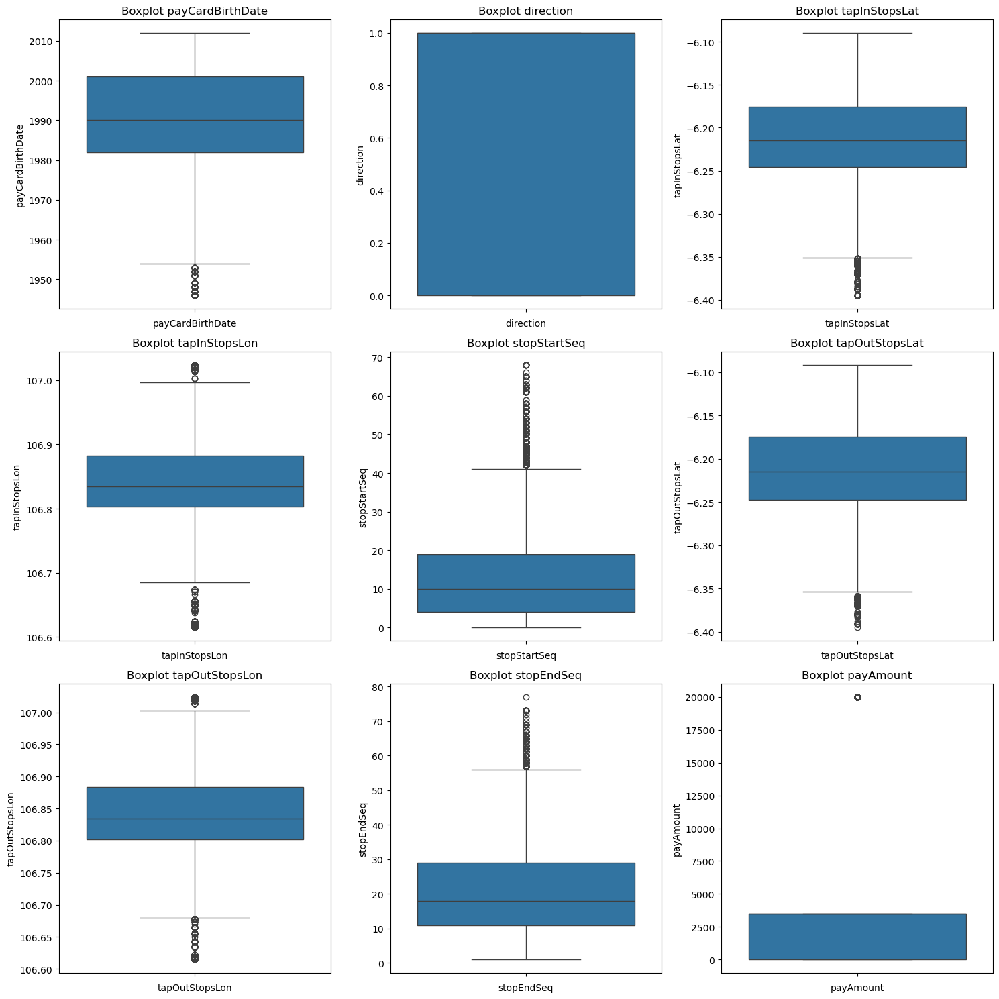

In [3841]:
kolom_number = transjakarta[['payCardBirthDate', 'direction', 'tapInStopsLat', 'tapInStopsLon',
       'stopStartSeq', 'tapOutStopsLat', 'tapOutStopsLon', 'stopEndSeq','payAmount']]

plt.figure(figsize=(15, 15))
for i, column in enumerate(kolom_number, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(data=transjakarta[column], orient='horizontal')
    plt.title(f'Boxplot {column}')
    plt.xlabel(column)

plt.tight_layout()
plt.show()

Dari hasil diatas dapat disimpulkan bahwa:

**Data tidak terdistribusi secara normal.**

Terdapat outlier pada hampir semua kolom, kecuali pada kolom `direction`, yang menunjukkan distribusi data yang lebih seragam tanpa penyimpangan. Hal ini kemungkinan disebabkan oleh skala pengukuran data yang sebagian besar bersifat kategorikal (nominal dan ordinal) atau memiliki rentang nilai yang sangat lebar pada kolom tertentu.

Untuk memastikan kesimpulan tersebut secara lebih mendalam, uji normalitas akan dilakukan pada setiap kolom untuk menganalisis distribusi data dengan lebih terperinci.

In [3843]:
from scipy.stats import kstest, norm

for i in kolom_number:
    ks_statistic, pvalue = kstest(transjakarta[i], 'norm', args=(transjakarta[i].mean(), transjakarta[i].std()))
    
    if pvalue > 0.05:
        print(f"\nKolom {i}, p-value: {round(pvalue, 3)}, Terdistribusi Normal")
    else:
        print(f"\nKolom {i}, p-value: {round(pvalue, 3)}, Tidak Terdistribusi Normal\n")


Kolom payCardBirthDate, p-value: 0.0, Tidak Terdistribusi Normal


Kolom direction, p-value: 0.0, Tidak Terdistribusi Normal


Kolom tapInStopsLat, p-value: 0.0, Tidak Terdistribusi Normal


Kolom tapInStopsLon, p-value: 0.0, Tidak Terdistribusi Normal


Kolom stopStartSeq, p-value: 0.0, Tidak Terdistribusi Normal


Kolom tapOutStopsLat, p-value: 0.0, Tidak Terdistribusi Normal


Kolom tapOutStopsLon, p-value: 0.0, Tidak Terdistribusi Normal


Kolom stopEndSeq, p-value: 0.0, Tidak Terdistribusi Normal


Kolom payAmount, p-value: 0.0, Tidak Terdistribusi Normal




**Kesimpulan Distribusi Data**

Berdasarkan hasil uji Kolmogorov-Smirnov, semua kolom memiliki ***p-value* = 0.0**, yang berarti data tidak terdistribusi normal. Hasil ini menunjukkan bahwa data valid namun tidak memenuhi asumsi normalitas. Oleh karena itu, analisis selanjutnya perlu menggunakan metode non-parametrik yang tidak bergantung pada distribusi normal.

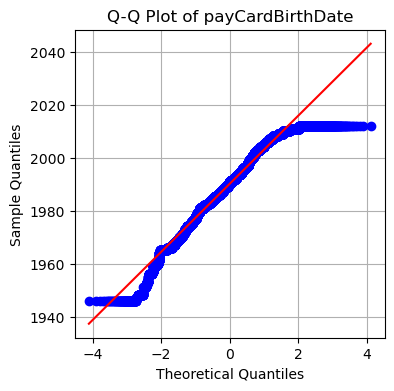

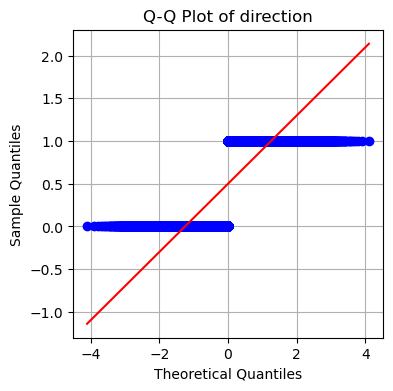

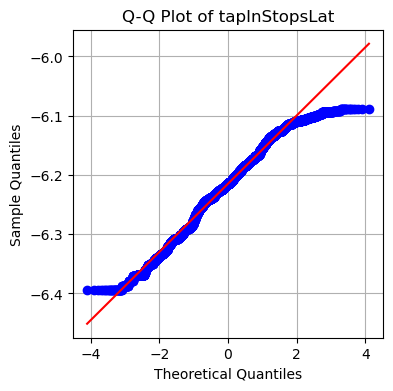

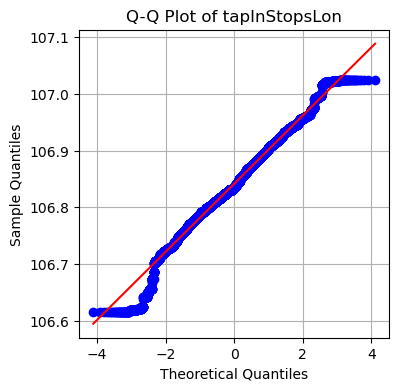

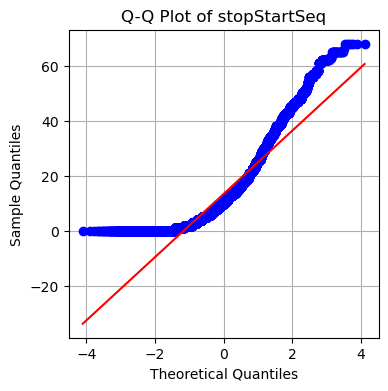

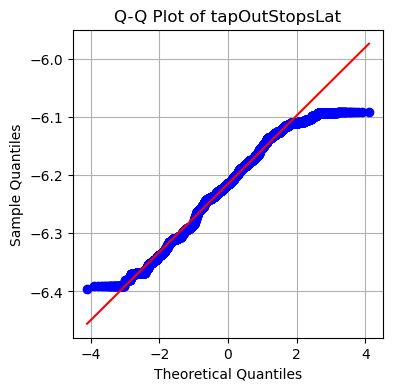

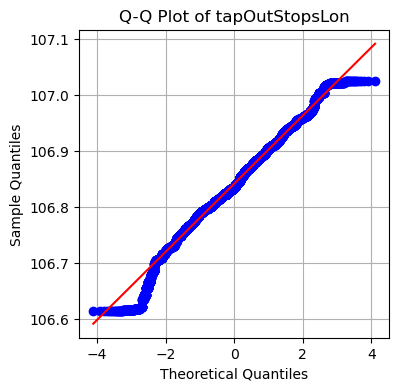

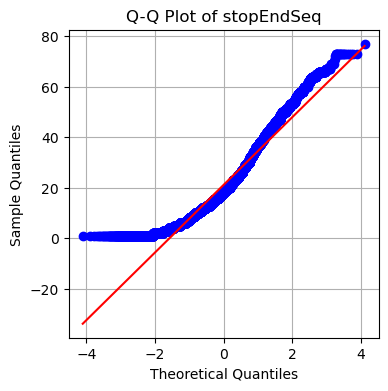

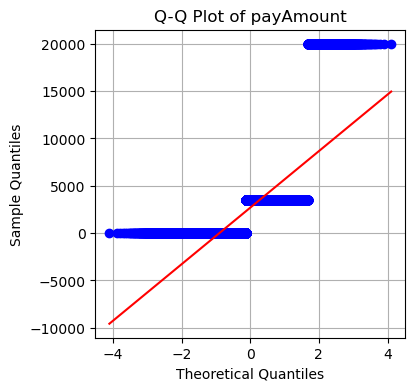

In [3845]:
for i, column in enumerate(kolom_number, 1):
    plt.figure(figsize=(4, 4))
    stats.probplot(transjakarta[column], dist="norm", plot=plt)
    plt.title(f"Q-Q Plot of {column}")
    plt.xlabel("Theoretical Quantiles")
    plt.ylabel("Sample Quantiles")
    plt.grid()
    plt.show()

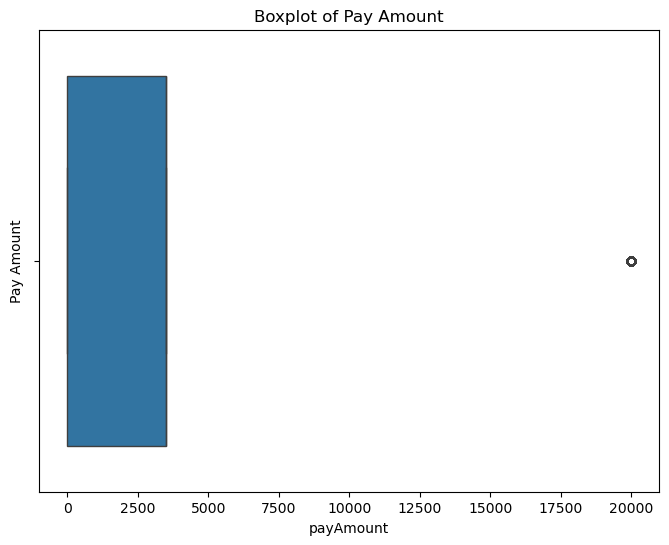

In [3847]:
plt.figure(figsize=(8, 6))
sns.boxplot(x=transjakarta['payAmount'])
plt.title('Boxplot of Pay Amount')
plt.ylabel('Pay Amount')
plt.show()

In [3849]:
transjakarta['payAmount'].max()

20000.0

Berdasarkan data di atas, nilai maksimal `payAmount` sebesar Rp20.000 masih valid, karena sesuai dengan [sumber ini](https://otomotif.kompas.com/read/2024/01/07/132100215/mengenal-layanan-bus-royaltrans-transjakarta-mewah-tarif-rp-20.000#google_vignette) yang menyebutkan bahwa harga Rp20.000 merupakan tarif Royal Trans. Hal ini menunjukkan bahwa nilai tersebut dapat diterima dan masuk akal.

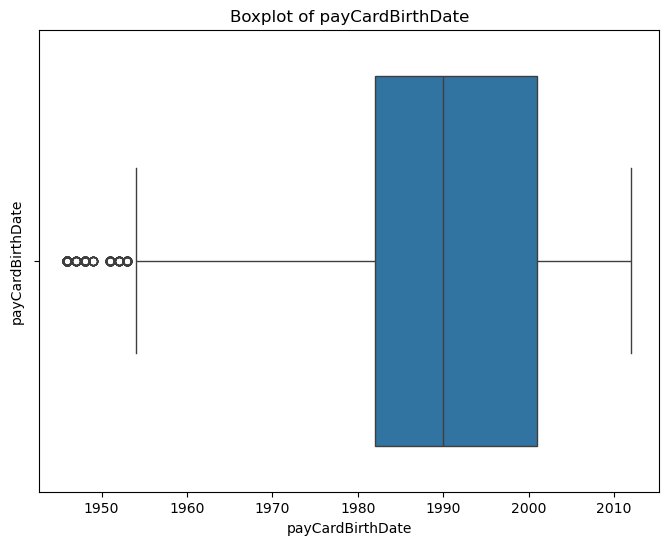

In [3851]:
plt.figure(figsize=(8, 6))
sns.boxplot(x=transjakarta['payCardBirthDate'])
plt.title('Boxplot of payCardBirthDate')
plt.ylabel('payCardBirthDate')
plt.show()

In [3852]:
transjakarta['payCardBirthDate'].min()

1946

In [3853]:
transjakarta['payCardBirthDate'].max()

2012

Berdasarkan hasil analisis data pada kolom `payCardBirthDate`, nilai minimum adalah tahun 1946 dan nilai maksimum adalah tahun 2012. Hal ini menunjukkan bahwa rentang usia penumpang yang tercatat berkisar antara 11 hingga 77 tahun (pada tahun analisis ini dilakukan). Rentang ini masih dapat diterima dan valid, mengingat pengguna TransJakarta mencakup berbagai kelompok usia, mulai dari anak-anak hingga lanjut usia.

In [3861]:
import folium
from folium.plugins import MarkerCluster
import pandas as pd

transjakarta_map = folium.Map(location=[-6.2, 106.8], zoom_start=10)

cluster_group = MarkerCluster().add_to(transjakarta_map)

stop_coordinates = transjakarta[['tapInStopsName', 'tapInStopsLat', 'tapInStopsLon']].drop_duplicates()

for idx, stop in stop_coordinates.iterrows():
    folium.Marker(
        location=[stop['tapInStopsLat'], stop['tapInStopsLon']],
        popup=stop['tapInStopsName']
    ).add_to(cluster_group)

transjakarta_map

Berdasarkan hasil visualisasi menggunakan peta dengan *MarkerCluster*, data `tapInStopsName` yang menunjukkan lokasi pemberhentian TransJakarta terlihat tersebar secara geografis dengan baik di berbagai wilayah Jakarta dan sekitarnya. Distribusi titik-titik pemberhentian ini mengindikasikan bahwa data `tapInStopsName` masih valid dan sesuai dengan persebaran lokasi halte atau pemberhentian TransJakarta yang ada.

Selain itu, *cluster* yang ditampilkan pada peta menunjukkan konsentrasi penggunaan di beberapa area tertentu, seperti pusat Jakarta dan wilayah padat lainnya, yang mencerminkan pola perjalanan yang wajar bagi pengguna TransJakarta. Validitas data ini dapat mendukung analisis lebih lanjut terkait efisiensi rute, kepadatan pengguna, atau optimasi sistem transportasi.

In [3863]:
import folium
from folium.plugins import MarkerCluster
import pandas as pd

transjakarta_map = folium.Map(location=[-6.2, 106.8], zoom_start=10)

cluster_group = MarkerCluster().add_to(transjakarta_map)

stop_coordinates = transjakarta[['tapOutStopsName', 'tapOutStopsLat', 'tapOutStopsLon']].drop_duplicates()

for idx, stop in stop_coordinates.iterrows():
    folium.Marker(
        location=[stop['tapOutStopsLat'], stop['tapOutStopsLon']],
        popup=stop['tapOutStopsName']
    ).add_to(cluster_group)

transjakarta_map

Sama halnya dengan `tapInStopsName`, data `tapOutStopsName` juga terlihat valid berdasarkan distribusi geografisnya. Titik-titik pemberhentian untuk tap out tersebar di berbagai wilayah, mencerminkan lokasi halte atau pemberhentian yang digunakan oleh penumpang TransJakarta untuk menyelesaikan perjalanan mereka.

Distribusi ini juga menunjukkan pola yang logis, di mana area dengan konsentrasi tinggi pada tap out umumnya berada di wilayah yang memiliki banyak aktivitas, seperti pusat kota atau kawasan pemukiman padat. Validitas data `tapOutStopsName` ini dapat digunakan untuk analisis lebih lanjut terkait pola pergerakan penumpang, volume penumpang per rute, atau evaluasi sistem transportasi TransJakarta secara keseluruhan.

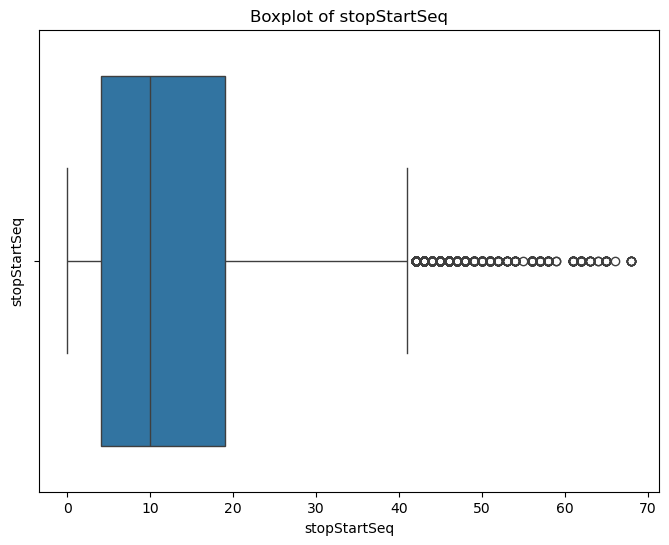

In [3865]:
plt.figure(figsize=(8, 6))
sns.boxplot(x=transjakarta['stopStartSeq'])
plt.title('Boxplot of stopStartSeq')
plt.ylabel('stopStartSeq')
plt.show()

In [3866]:
transjakarta[['stopStartSeq']].max()

stopStartSeq    68
dtype: int64

In [3867]:
transjakarta[transjakarta['stopStartSeq'] == 68]['corridorID']

35046    JAK.33
35446    JAK.33
35846    JAK.33
36246    JAK.33
36646    JAK.33
37046    JAK.33
37446    JAK.33
Name: corridorID, dtype: object

![](Rute_Jak33.jpg)

Berdasarkan data yang ditampilkan, nilai maksimum `stopStartSeq` sebesar 68 masih dapat dianggap wajar. Hal ini terlihat pada koridor JAK.33, yang memiliki rute panjang dari Pulo Gadung menuju Kota via JIEXPO, dengan jumlah pemberhentian yang signifikan. Jumlah pemberhentian yang banyak sesuai dengan panjangnya rute serta cakupan wilayah yang dilalui oleh koridor ini.

Visualisasi rute pada gambar mendukung bahwa nilai `stopStartSeq` sebesar 68 mencerminkan kondisi nyata di lapangan, di mana rute ini memang memiliki banyak halte pemberhentian. Oleh karena itu, nilai tersebut valid dan dapat diterima dalam konteks operasional TransJakarta.

# Data Transformation

In [3872]:
corridor_name_count = transjakarta.groupby('corridorName')['corridorID'].nunique()

corridor_muncul_lebih_dari_1 = corridor_name_count[corridor_name_count > 1].sort_values(ascending=False)

corridor_muncul_lebih_dari_1

corridorName
Blok M - Kota                          2
Kalideres - Bundaran HI via Veteran    2
Matraman Baru - Ancol                  2
Pinang Ranti - Pluit                   2
Pulo Gadung - Monas                    2
Name: corridorID, dtype: int64

In [3873]:
result = transjakarta.query("corridorName in ['Blok M - Kota','Kalideres - Bundaran HI via Veteran', 'Matraman Baru - Ancol', 'Pinang Ranti - Pluit', 'Pulo Gadung - Monas']")[['corridorName', 'corridorID']].value_counts().reset_index(name='count')
result.columns = ['corridorName', 'corridorID', 'count']
result

,corridorName,corridorID,count
0,Pulo Gadung - Monas,2,268
1,Matraman Baru - Ancol,5,238
2,Blok M - Kota,1,222
3,Kalideres - Bundaran HI via Veteran,M3,195
4,Pinang Ranti - Pluit,M9,144
5,Kalideres - Bundaran HI via Veteran,3,124
6,Pulo Gadung - Monas,M2,60
7,Blok M - Kota,M1,58
8,Pinang Ranti - Pluit,9,58
9,Matraman Baru - Ancol,M5,17


Berdasarkan tabel yang ditampilkan, terdapat beberapa kasus di mana satu nama koridor `corridorName` memiliki lebih dari satu kode identifikasi `corridorID`. Sebagai contoh:

- **Pulo Gadung - Monas** memiliki `corridorID` **2** dan **M2**.
- **Kalideres - Bundaran HI via Veteran** memiliki `corridorID` **3** dan **M3**.
- **Matraman Baru - Ancol** memiliki `corridorID` **5** dan **M5**.
- **Pinang Ranti - Pluit** memiliki `corridorID` **9** dan **M9**.


Hal ini menunjukkan bahwa ada duplikasi pada `corridorName` dengan `corridorID` yang berbeda.

Solusi untuk menyamakan `corridorID` yang memiliki format berbeda, seperti mengganti **M1** menjadi **1**, **M2** menjadi **2**, dan seterusnya, dapat dilakukan menggunakan `np.where`. Pendekatan ini memastikan bahwa semua corridorID memiliki format yang konsisten, sehingga mempermudah analisis dan pengelolaan data.

In [3875]:
transjakarta['corridorName'] = np.where(
    transjakarta['corridorName'] == 'M1', '1',
    np.where(transjakarta['corridorName'] == 'M2', '2',
    np.where(transjakarta['corridorName'] == 'M3', '3',
    np.where(transjakarta['corridorName'] == 'M5', '5',
    np.where(transjakarta['corridorName'] == 'M9', '9', 
    np.where(transjakarta['corridorName'] == 'M1H', '1H',
    transjakarta['corridorName']))))))

In [3876]:
from geopy.distance import geodesic

def calculate_distance(row):
    start = (row['tapInStopsLat'], row['tapInStopsLon'])
    end = (row['tapOutStopsLat'], row['tapOutStopsLon'])
    return geodesic(start, end).kilometers * 2

transjakarta['DistanceTravelled'] = transjakarta.apply(calculate_distance, axis=1)
transjakarta['DistanceTravelled'] = transjakarta['DistanceTravelled'].round(2)
transjakarta[['tapInStopsLat', 'tapOutStopsLon', 'DistanceTravelled']]

,tapInStopsLat,tapOutStopsLon,DistanceTravelled
0,-6.184631,106.85715,5.01
1,-6.228700,106.81892,4.03
2,-6.133132,106.81475,0.16
3,-6.195743,106.93194,2.90
4,-6.149650,106.81143,17.46
...,...,...,...
37895,-6.196892,106.82365,20.81
37896,-6.290154,106.88634,1.16
37897,-6.216247,106.89628,38.35
37898,-6.188656,106.81135,0.40


In [3878]:
transjakarta['emission'] = transjakarta['DistanceTravelled'] * 8 * 2.7

![image.png](Paper-CO2.png)

Dalam analisis ini, kami mengasumsikan bahwa semua bus menggunakan bahan bakar diesel. Untuk menghitung emisi karbon, kami merujuk pada [paper ini](https://natural-resources.canada.ca/sites/nrcan/files/oee/pdf/transportation/fuel-efficient-technologies/autosmart_factsheet_9_e.pdf?), yang menyatakan bahwa setiap liter bahan bakar diesel menghasilkan sekitar 2,7 kg CO2 dan saya asumsikan konsumsi bahan bakar bus 8 liter dalam 1 km. Asumsi ini digunakan sebagai dasar perhitungan untuk mengestimasi total emisi karbon yang dihasilkan oleh bus TransJakarta.

In [3887]:
transjakarta['payCardID'] = transjakarta['payCardID'].astype('object')

In [3888]:
def categorize_distance(distance):
    if distance < 5:
        return "Pendek"
    elif 5 <= distance < 15:
        return "Sedang"
    else:
        return "Jauh"

transjakarta['kategori_jarak'] = transjakarta['DistanceTravelled'].apply(categorize_distance)
transjakarta

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,DistanceTravelled,emission,kategori_jarak
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,...,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500.0,5.01,108.216,Sedang
1,LGXO740D2N47GZ,4885331907664776,dki,Gandi Widodo,F,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,...,B03307P,Sampoerna Strategic,-6.217152,106.81892,21.0,2023-04-03 06:40:01,3500.0,4.03,87.048,Pendek
2,DJWR385V2U57TO,4996225095064169,dki,Emong Wastuti,F,1992,R1A,Pantai Maju - Kota,0.0,B00499P,...,B04962P,Simpang Kunir Kemukus,-6.133731,106.81475,39.0,2023-04-03 06:50:55,3500.0,0.16,3.456,Pendek
3,JTUZ800U7C86EH,639099174703,flazz,Surya Wacana,F,1978,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,...,B03090P,Raya Penggilingan,-6.183068,106.93194,29.0,2023-04-03 06:28:16,3500.0,2.90,62.640,Pendek
4,VMLO535V7F95NJ,570928206772,flazz,Embuh Mardhiyah,M,1982,12,Tanjung Priok - Pluit,0.0,P00239,...,P00098,Kali Besar Barat,-6.135355,106.81143,15.0,2023-04-03 06:57:03,3500.0,17.46,377.136,Jauh
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37895,ZWEC949B8Q87QG,4685818286724028395,brizzi,Kamila Mahendra,F,2004,6B,Ragunan - MH Thamrin via Semanggi,1.0,P00261,...,P00228,SMK 57,-6.290967,106.82365,13.0,2023-04-21 19:55:49,3500.0,20.81,449.496,Jauh
37896,YHHK837P6Y95GN,6502902290603767,dki,Titi Siregar,M,1974,9N,Pinang Ranti - Pramuka,1.0,P00064,...,P00179,Pinang Ranti,-6.291075,106.88634,2.0,2023-04-18 22:28:22,3500.0,1.16,25.056,Pendek
37897,YXPP627N4G95HO,213159426675861,emoney,drg. Zahra Nashiruddin,F,1976,1T,Cibubur - Balai Kota,1.0,B02873P,...,B00226P,Buperta Cibubur,-6.370321,106.89628,14.0,2023-04-04 13:27:25,20000.0,38.35,828.360,Jauh
37898,RGVK175U2U98UV,377840859133591,emoney,Ana Agustina,M,1976,JAK.13,Tanah Abang - Jembatan Lima,1.0,B02505P,...,B01787P,JPO Blok G,-6.188861,106.81135,34.0,2023-04-15 20:27:50,0.0,0.40,8.640,Pendek


In [3889]:
transjakarta['tapInTime'] = pd.to_datetime(transjakarta['tapInTime'])
transjakarta['tapOutTime'] = pd.to_datetime(transjakarta['tapOutTime'])

transjakarta['tripDurationMinute'] = (transjakarta['tapOutTime'] - transjakarta['tapInTime']).dt.total_seconds() / 60
transjakarta['tripDurationMinute'] = transjakarta['tripDurationMinute'].round(2)
transjakarta[['tapInTime', 'tapOutTime', 'tripDurationMinute']].head(100)

,tapInTime,tapOutTime,tripDurationMinute
0,2023-04-03 05:21:44,2023-04-03 06:00:53,39.15
1,2023-04-03 05:42:44,2023-04-03 06:40:01,57.28
2,2023-04-03 05:59:06,2023-04-03 06:50:55,51.82
3,2023-04-03 05:44:51,2023-04-03 06:28:16,43.42
4,2023-04-03 06:17:35,2023-04-03 06:57:03,39.47
5,2023-04-03 05:08:01,2023-04-03 05:52:25,44.40
8,2023-04-03 06:01:44,2023-04-03 06:51:12,49.47
9,2023-04-03 05:57:47,2023-04-03 06:51:12,53.42
10,2023-04-03 06:32:28,2023-04-03 07:23:54,51.43
11,2023-04-03 06:22:10,2023-04-03 06:50:21,28.18


# Data Analisis

TransJakarta telah menetapkan tujuh rute utama untuk pengoperasian bus listrik. Dalam analisis ini, fokus kami adalah **mengevaluasi emisi karbon yang dihasilkan dari ketujuh rute tersebut dan menilai apakah pemilihan rute ini sudah tepat untuk implementasi bus listrik**. Tujuan dari analisis ini adalah:

- Mengoptimalkan distribusi armada bus listrik berdasarkan prioritas pengurangan emisi karbon.
- Menganalisis waktu operasional tertinggi dan jarak tempuh rata-rata per rute, untuk memastikan efisiensi implementasi bus listrik.
- Mengidentifikasi rute-rute yang masih menggunakan bus berbahan bakar bensin dan memiliki potensi untuk dialihkan ke armada bus listrik secara efektif.

Analisis ini diharapkan dapat memberikan gambaran yang lebih jelas untuk mendukung strategi keberlanjutan TransJakarta dalam mengurangi emisi karbon secara maksimal.

Dalam analisis ini, kami hanya memfokuskan pada bus BRT dan non-BRT, karena layanan Royal Trans dan jenis kendaraan Jak memiliki karakteristik yang berbeda. Royal Trans menyediakan layanan premium, sementara Jak menggunakan tipe kendaraan yang tidak dapat digantikan oleh bus listrik. Oleh karena itu, saya membuat filter khusus untuk bus BRT dan non-BRT dengan menggunakan nilai payAmount sebesar 3.500 sebagai acuan, karena merepresentasikan tarif reguler. Selain itu, koridor seperti 'JIS3', 'M7B', '13C', '8A', '13D', dan '10K' juga telah dikeluarkan dari analisis, karena koridor-koridor tersebut sudah tidak beroperasi. Langkah ini dilakukan untuk mempertajam hasil analisis dan memastikan data yang digunakan lebih relevan.

In [3892]:
# Filter data dengan kondisi yang sesuai
bus_bensin = transjakarta[
    (transjakarta['payAmount'] == 3500) & 
    (~transjakarta['corridorID'].isin(['JIS3', 'M7B', '13C', '8A', '13D', '10K']))
]

bus_bensin

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,DistanceTravelled,emission,kategori_jarak,tripDurationMinute
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,...,Tegalan,-6.203101,106.857150,12.0,2023-04-03 06:00:53,3500.0,5.01,108.216,Sedang,39.15
1,LGXO740D2N47GZ,4885331907664776,dki,Gandi Widodo,F,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,...,Sampoerna Strategic,-6.217152,106.818920,21.0,2023-04-03 06:40:01,3500.0,4.03,87.048,Pendek,57.28
2,DJWR385V2U57TO,4996225095064169,dki,Emong Wastuti,F,1992,R1A,Pantai Maju - Kota,0.0,B00499P,...,Simpang Kunir Kemukus,-6.133731,106.814750,39.0,2023-04-03 06:50:55,3500.0,0.16,3.456,Pendek,51.82
3,JTUZ800U7C86EH,639099174703,flazz,Surya Wacana,F,1978,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,...,Raya Penggilingan,-6.183068,106.931940,29.0,2023-04-03 06:28:16,3500.0,2.90,62.640,Pendek,43.42
4,VMLO535V7F95NJ,570928206772,flazz,Embuh Mardhiyah,M,1982,12,Tanjung Priok - Pluit,0.0,P00239,...,Kali Besar Barat,-6.135355,106.811430,15.0,2023-04-03 06:57:03,3500.0,17.46,377.136,Jauh,39.47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37886,IFPF807G7R92DX,213160779285738,emoney,"R. Putri Kusumo, S.E.I",F,1997,1A,Pantai Maju - Balai Kota,0.0,B06040P,...,Sawah Besar Arah Selatan,-6.157368,106.818661,27.0,2023-04-09 17:44:38,3500.0,20.62,445.392,Jauh,119.23
37887,UELP204M1S64QX,4068989702474318,dki,Ajimat Pradana,F,1980,4D,Pulo Gadung 2 - Kuningan,0.0,P00269,...,Pramuka LIA,-6.192238,106.868580,9.0,2023-04-04 15:38:58,3500.0,4.37,94.392,Pendek,46.45
37895,ZWEC949B8Q87QG,4685818286724028395,brizzi,Kamila Mahendra,F,2004,6B,Ragunan - MH Thamrin via Semanggi,1.0,P00261,...,SMK 57,-6.290967,106.823650,13.0,2023-04-21 19:55:49,3500.0,20.81,449.496,Jauh,97.20
37896,YHHK837P6Y95GN,6502902290603767,dki,Titi Siregar,M,1974,9N,Pinang Ranti - Pramuka,1.0,P00064,...,Pinang Ranti,-6.291075,106.886340,2.0,2023-04-18 22:28:22,3500.0,1.16,25.056,Pendek,35.85


## **Analisa Emisi Yang di Hasilkan Berdasarkan Jarak**

In [3894]:
top_10_longest_routes = bus_bensin.sort_values(by='DistanceTravelled', ascending=False)
unique_routes = top_10_longest_routes.drop_duplicates(subset=['corridorID'], keep='first')
brt_routes_display = unique_routes[['corridorID', 'corridorName', 'DistanceTravelled']]
brt_routes_display.head(10)

,corridorID,corridorName,DistanceTravelled
33520,10D,Kampung Rambutan - Tanjung Priok,41.86
17307,T11,Poris Plawad - Bundaran Senayan,41.84
34294,2A,Pulo Gadung - Rawa Buaya via Balai Kota,37.59
37359,M9,Pinang Ranti - Pluit,35.75
13388,B21,Bekasi Timur - Cawang,33.78
33430,7F,Kampung Rambutan - Juanda via Pasar Baru,32.36
34687,M7,Kampung Rambutan - Monas,32.34
34483,10H,Tanjung Priok - Blok M,31.74
20484,M10,PGC 2 - Tanjung Priok,31.18
34142,M8,Lebak Bulus - Pasar Baru,30.40


In [3895]:
brt_routes_display.to_csv('brt_routes_display.csv')

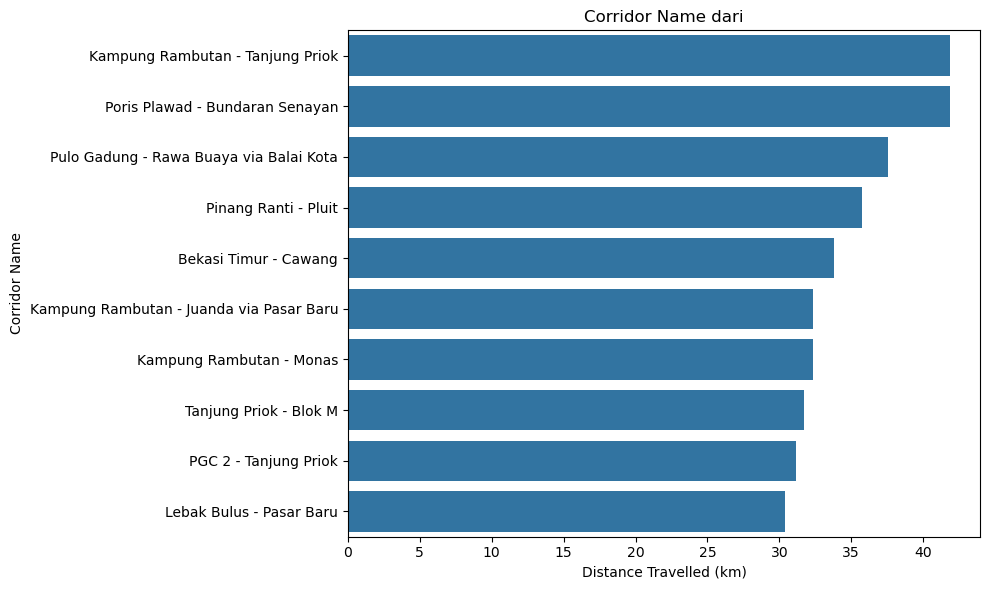

In [3897]:
plt.figure(figsize=(10, 6))
sns.barplot(y='corridorName', x='DistanceTravelled', data=top_10_brt_routes, orient='h')

# Menambahkan label dan judul plot
plt.ylabel('Corridor Name')
plt.xlabel('Distance Travelled (km)')
plt.title('Corridor Name dari')

# Menampilkan plot
plt.tight_layout()
plt.show()

In [3900]:
import scipy.stats as stats

# Misalnya 'transjakarta' adalah dataframe yang berisi data jarak dan ID koridor
koridor = top_10_longest_routes['corridorID'].unique()
data_per_koridor = [top_10_longest_routes[top_10_longest_routes['corridorID'] == koridor]['DistanceTravelled'] for koridor in koridor]

# Lakukan kruskal Satu Arah
f_statistic, p_value = stats.kruskal(*data_per_koridor)

# Output hasilnya
print("F-statistik:", f_statistic)
print("P-value:", p_value)

# Interpretasi hasil
if p_value < 0.05:
    print("Ada perbedaan signifikan antara ID koridor.")
else:
    print("Tidak ada perbedaan signifikan antara ID koridor.")


F-statistik: 4041.3662592829996
P-value: 0.0
Ada perbedaan signifikan antara ID koridor.


Hasil uji Kruskal-Wallis menunjukkan adanya perbedaan signifikan dalam jarak tempuh antara kelompok berdasarkan `corridorID`, dengan p-value sebesar 0.0 (p < 0.05). Hal ini mengindikasikan bahwa jarak tempuh bervariasi di setiap koridor, yang mungkin disebabkan oleh perbedaan panjang rute atau karakteristik operasional masing-masing koridor.

In [3908]:
top_10_durasi = bus_bensin.sort_values(by='emission', ascending=False)

unique_routes = top_10_durasi.drop_duplicates(subset=['corridorID'], keep='first')

durasi_banyak = unique_routes[['corridorID', 'corridorName', 'DistanceTravelled', 'tripDurationMinute', 'emission']].head(10)
durasi_banyak

,corridorID,corridorName,DistanceTravelled,tripDurationMinute,emission
33520,10D,Kampung Rambutan - Tanjung Priok,41.86,61.65,904.176
17307,T11,Poris Plawad - Bundaran Senayan,41.84,103.12,903.744
34294,2A,Pulo Gadung - Rawa Buaya via Balai Kota,37.59,52.50,811.944
37359,M9,Pinang Ranti - Pluit,35.75,94.90,772.200
13388,B21,Bekasi Timur - Cawang,33.78,46.53,729.648
33430,7F,Kampung Rambutan - Juanda via Pasar Baru,32.36,86.92,698.976
34687,M7,Kampung Rambutan - Monas,32.34,51.38,698.544
34483,10H,Tanjung Priok - Blok M,31.74,26.17,685.584
20484,M10,PGC 2 - Tanjung Priok,31.18,29.32,673.488
34142,M8,Lebak Bulus - Pasar Baru,30.40,58.33,656.640


In [3910]:
durasi_banyak.to_csv('Emisi.csv')

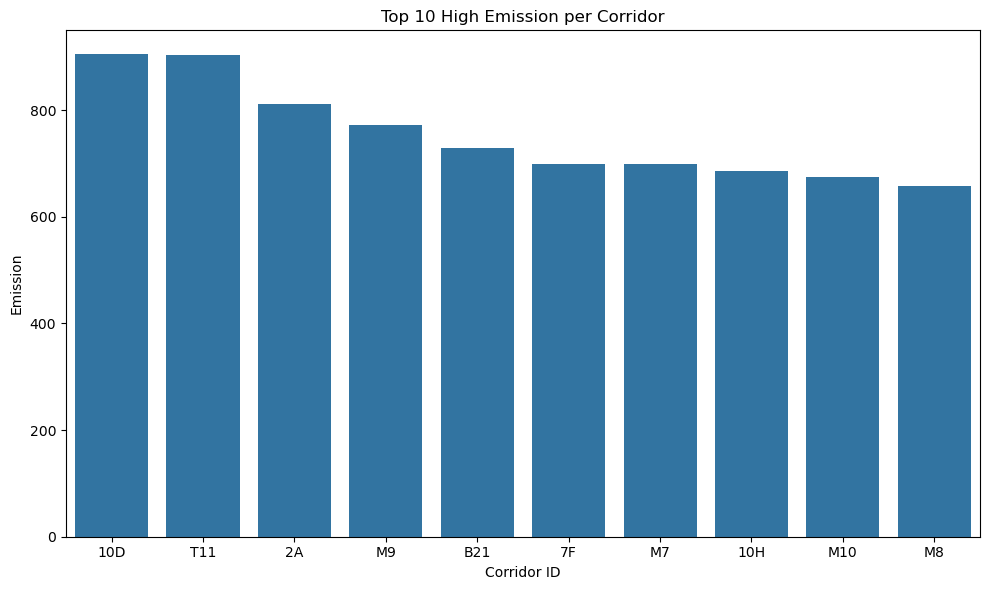

In [3913]:
import matplotlib.pyplot as plt
import seaborn as sns

top_10_durasi = durasi_banyak.sort_values(by='emission', ascending=False).head(10)

plt.figure(figsize=(10, 6))
sns.barplot(x='corridorID', y='emission', data=top_10_durasi)

# Menambahkan label dan judul
plt.xlabel('Corridor ID')
plt.ylabel('Emission')
plt.title('Top 10 High Emission per Corridor')


# Menampilkan bar chart
plt.tight_layout()
plt.show()


In [3951]:
emisi_faktor = {
    '10D': 35,
    'T11': 32,
    '2A': 52,
    '9': 103,
    'B21': 26,
    '7F': 56,
    'M7': 15,
    '10H': 17,
    'M10': 15,
    'M8': 15,
    '5': 128,
    '6C':103,
    'R1A':52,
    '11D': 37,
    '12':103,
    '1Q':138,
    '5M':103,
    '9A':52,
    'S22':35,
    '13':103,
    '9E':103,
    '6V':52, 
    '11Q':52,
    '11':146, 
    '1C':48, 
    '1':173, 
    '7E':17, 
    '1P':35,
    '7D':50, 
    '6H':103,
    '14':52,
    '6N':18,
    'M11':15,
    '9N':35, 
    '2':146, 
    '7P':33, 
    '13B':67,
    '9D':69, 
    '12A':23, 
    '8K':52,
    'B11':25,
    '8C':99,
    '12B':103,
    '5D':103,
    '3H':69,
    '7A':80,
    '7Q':60,
    '1M':33,
    '5C':146,
    '6Q':52,
    '8E':103,
    '6M':69,
    'L13E':67,
    '12P':35,
    '1F':52,
    '4B':86,
    '7C':35, 
    '2A':52,
    '3':146, 
    '1E':35,
    'M4':8,
    '9H':35,
    '5N':49,
    '6T':52, 
    '5F':27,
    '2P':100, 
    'S21':52,
    'M12':15,
    '1N':103,
    '6U':52,
    '10':91,
    '1H':26,
    '2B':69,
    '6A':52,
    '4F':52,
    '6B':61,
    '5B':35,
    'M6':15,
    '8':205,
    '3F':55,
    'S11':69, 
    '6D':35,
    '4C':66,
    'M13':15,
    '8D':103,
    '4D':52,
    '7':128,
    '9C':51,
    'D21':33,
    'D11':49,
    '8M':103,
    '1B':50,
    '6':86,
    '3E':31,
    '12H':52,
    '1A':83,
    '2Q':100,
    '1R':103,
    '4':103,
    '7B':52
    
}

bus_bensin['emisiPerHari'] = bus_bensin['emission'] * bus_bensin['corridorID'].map(emisi_faktor)

sorted_durasi = bus_bensin[['corridorID', 'corridorName', 'DistanceTravelled', 'emisiPerHari', 'emission']].sort_values(by='emisiPerHari', ascending=False)
unique_sorted_durasi = sorted_durasi.drop_duplicates(subset='corridorID', keep='first')

top_10 = unique_sorted_durasi.head(10)


Disini kami menambahkan kolom `emisiperhar`i yang dihitung dari hasil perkalian antara `emission` satu kali perjalanan dengan **jumlah keberangkatan per hari** untuk setiap corridorID. Langkah ini bertujuan untuk memberikan gambaran yang lebih adil.

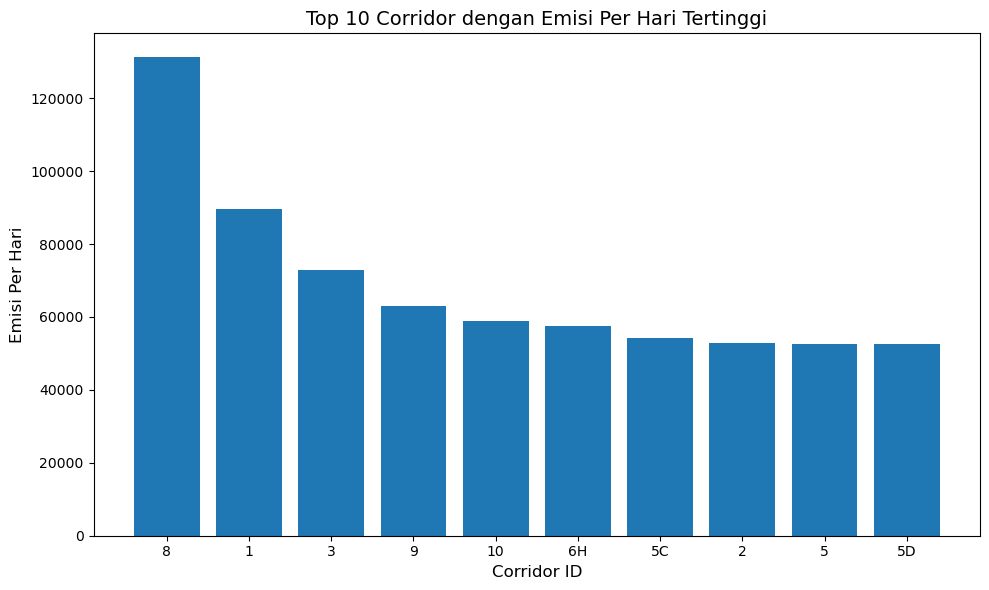

In [3954]:
# Plot bar chart
plt.figure(figsize=(10, 6))
plt.bar(top_10['corridorID'], top_10['emisiPerHari'], tick_label=top_10['corridorID'])

# Tambahkan label dan judul
plt.xlabel('Corridor ID', fontsize=12)
plt.ylabel('Emisi Per Hari', fontsize=12)
plt.title('Top 10 Corridor dengan Emisi Per Hari Tertinggi', fontsize=14)
plt.tight_layout()

# Tampilkan bar chart
plt.show()

In [3955]:
# Gabungkan koordinat tap-in dan tap-out menjadi kolom rute
bus_bensin['route'] = bus_bensin.apply(
    lambda row: f"({row['tapInStopsLat']}, {row['tapInStopsLon']}) -> ({row['tapOutStopsLat']}, {row['tapOutStopsLon']})", 
    axis=1
)

# Menampilkan contoh kolom rute yang baru dibuat
map = bus_bensin[['tapInStopsLat', 'tapInStopsLon', 'tapOutStopsLat', 'tapOutStopsLon', 'route']].head(10)
map.to_csv('map1.csv')

In [3957]:
bus_bensin['corridorID'].nunique()

105

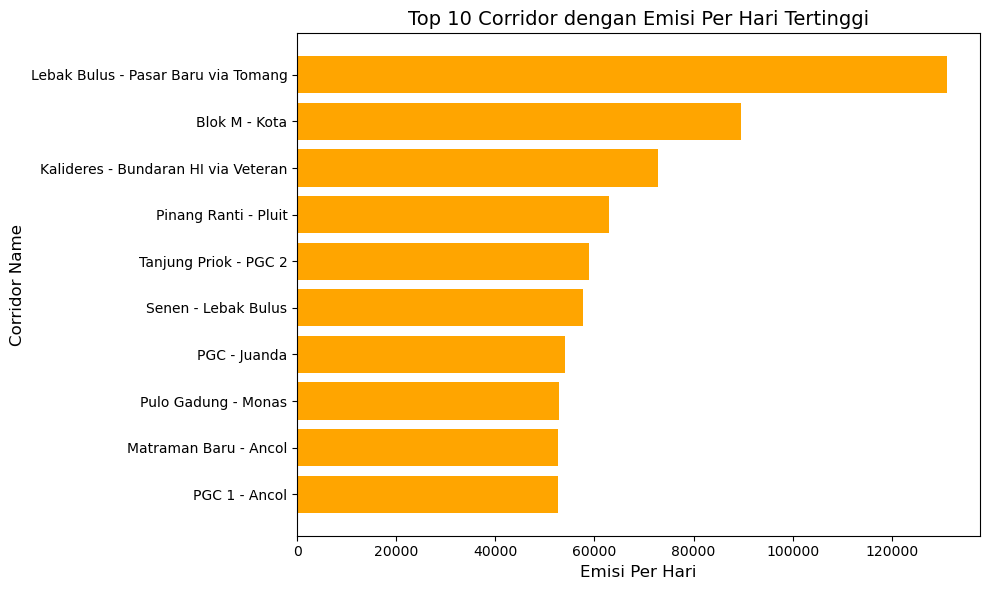

In [3960]:
top_10 = top_10.iloc[::-1]
plt.figure(figsize=(10, 6))
plt.barh(top_10['corridorName'], top_10['emisiPerHari'], color='orange')
plt.ylabel('Corridor Name', fontsize=12)
plt.xlabel('Emisi Per Hari', fontsize=12)
plt.title('Top 10 Corridor dengan Emisi Per Hari Tertinggi', fontsize=14)
plt.tight_layout()
plt.show()

## **Analisa Emisi Yang di Hasilkan Berdasarkan Faktor Kemacetan**

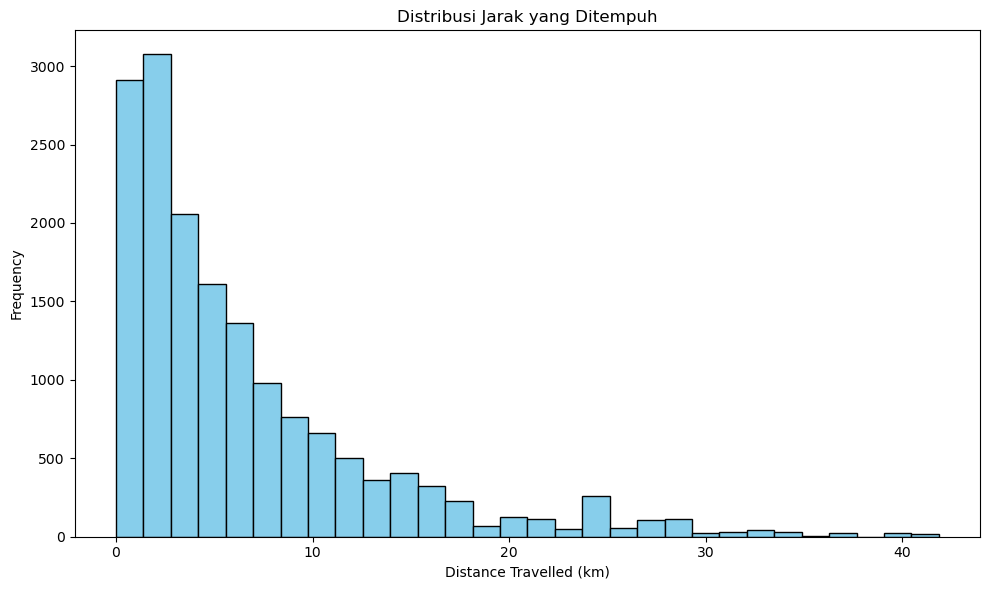

In [3963]:
import matplotlib.pyplot as plt

# Menghitung distribusi dari 'DistanceTravelled'
plt.figure(figsize=(10, 6))
plt.hist(bus_bensin['DistanceTravelled'], bins=30, color='skyblue', edgecolor='black')

# Menambahkan label dan judul
plt.xlabel('Distance Travelled (km)')
plt.ylabel('Frequency')
plt.title('Distribusi Jarak yang Ditempuh')

# Menampilkan histogram
plt.tight_layout()
plt.show()

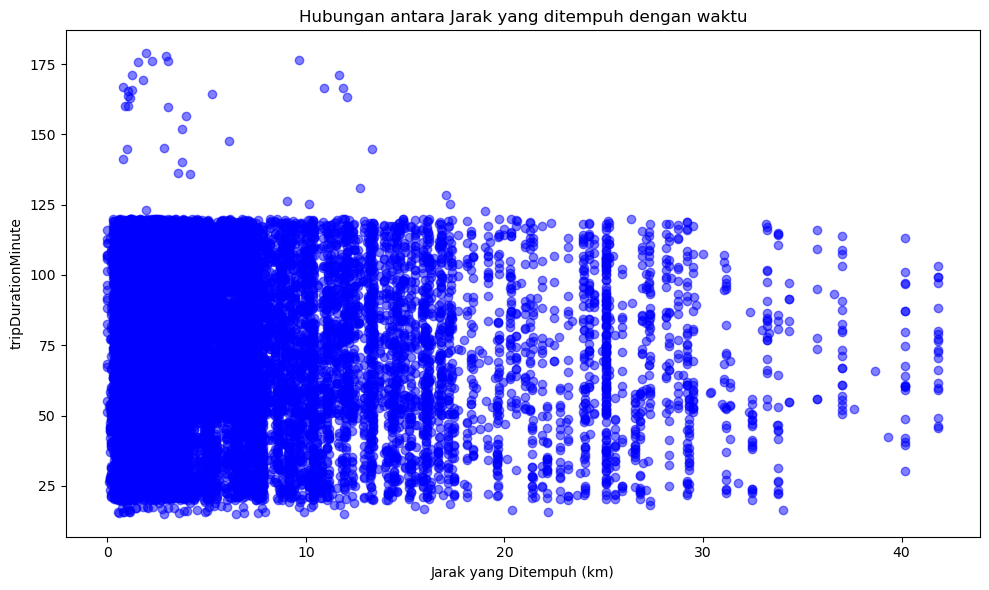

In [3965]:
plt.figure(figsize=(10, 6))
plt.scatter(bus_bensin['DistanceTravelled'], bus_bensin['tripDurationMinute'], alpha=0.5, color='blue')
plt.xlabel('Jarak yang Ditempuh (km)')
plt.ylabel('tripDurationMinute')
plt.title('Hubungan antara Jarak yang ditempuh dengan waktu')
plt.tight_layout()
plt.show()

**Indikasi Kemacetan**

Berdasarkan *scatter plot* yang menunjukkan hubungan antara jarak tempuh (km) dan durasi perjalanan (menit), dapat disimpulkan bahwa banyak rute mengalami kemacetan. Hal ini terlihat dari distribusi data, di mana durasi perjalanan cenderung tinggi meskipun jarak tempuhnya pendek. Untuk mengatasi masalah ini dan memahami efisiensi perjalanan lebih baik, kami menambahkan kolom `average_speed_kmh` yang menghitung rata-rata kecepatan perjalanan. Kolom ini membantu memberikan gambaran yang lebih jelas tentang kecepatan di setiap rute, sehingga faktor kemacetan dapat dianalisis dengan lebih mendalam.

In [3968]:
bus_bensin['average_speed_kmh'] = ((bus_bensin['DistanceTravelled'] / bus_bensin['tripDurationMinute']) * 60).round(2)

 **Rumus Rata-rata Kecepatan**
 

- V = Kecepatan tempuh (km/jam)
- S = Jarak (km/jam)
- t = Waktu (Minute)

V = S/t

Untuk mendapatkan rata-rata kecepatan, kami merujuk pada metode yang dijelaskan dalam [paper ini](https://media.neliti.com/media/publications/445471-none-95201a2c.pdf?utm_source=chatgpt.com). Dalam paper tersebut, digunakan rumus sederhana yang mendefinisikan kecepatan rata-rata sebagai hasil pembagian antara jarak tempuh dengan waktu tempuh. Pendekatan ini memungkinkan kami untuk menghitung rata-rata kecepatan secara sistematis berdasarkan data yang tersedia.

In [3971]:
corridor_analysis = bus_bensin.groupby(['corridorName','corridorID']).agg({
    'average_speed_kmh': 'mean',
    'tripDurationMinute': 'mean',
    'DistanceTravelled': 'mean',
}).reset_index().round(2)

corridor_analysis = corridor_analysis.sort_values(by=['average_speed_kmh'])

# Menampilkan hasil
t10 = corridor_analysis.head(10)
t10

,corridorName,corridorID,average_speed_kmh,tripDurationMinute,DistanceTravelled
15,Gondangdia - Balai Kota,2Q,0.94,74.95,1.00
82,Rusun Penjaringan - Penjaringan,12H,1.09,75.21,1.16
99,Tanah Abang - St. Gondangdia,M1H,1.16,76.14,1.28
16,Gondangdia - Senen,2P,1.42,78.09,1.65
100,Tanah Abang - Stasiun Gondangdia,1H,1.98,74.84,1.91
91,Stasiun Palmerah - Tosari,1B,2.12,81.54,2.65
14,Dukuh Atas - Casablanca via Epicentrum Raya,6Q,2.33,71.01,2.16
90,Stasiun Palmerah - Bundaran Senayan,1F,2.33,76.35,2.49
88,Stasiun Manggarai - Blok M,6M,2.75,62.97,2.20
93,Stasiun Tebet - Karet via Patra Kuningan,6C,2.80,74.39,2.83


In [3973]:
t10.to_csv('t10.csv')

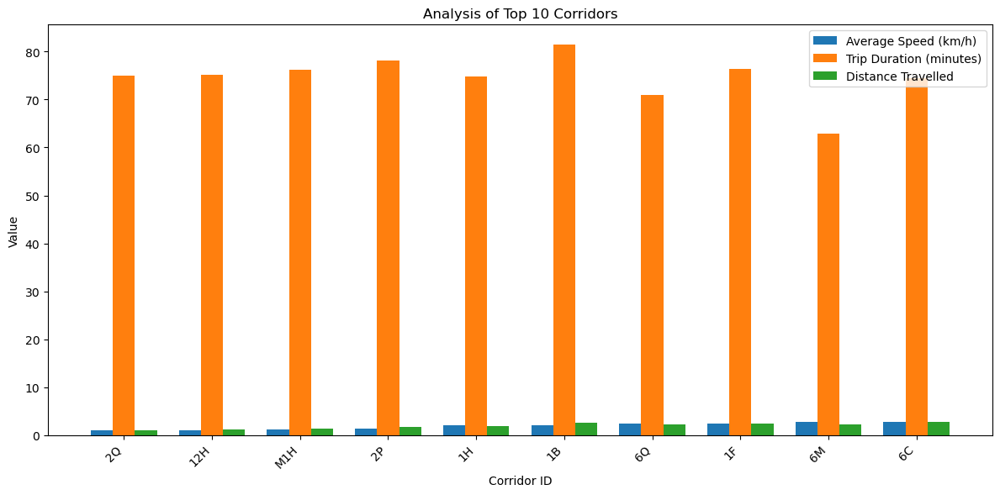

In [3975]:
import matplotlib.pyplot as plt
import numpy as np

# Data
x = np.arange(len(t10['corridorID'])) 
width = 0.25

fig, ax = plt.subplots(figsize=(12, 6))

# Bar untuk tiap metrik
ax.bar(x - width, t10['average_speed_kmh'], width, label='Average Speed (km/h)')
ax.bar(x, t10['tripDurationMinute'], width, label='Trip Duration (minutes)')
ax.bar(x + width, t10['DistanceTravelled'], width, label='Distance Travelled')

# Labeling
ax.set_xlabel('Corridor ID')
ax.set_ylabel('Value')
ax.set_title('Analysis of Top 10 Corridors')
ax.set_xticks(x)
ax.set_xticklabels(t10['corridorID'], rotation=45, ha='right')
ax.legend()

plt.tight_layout()
plt.show()


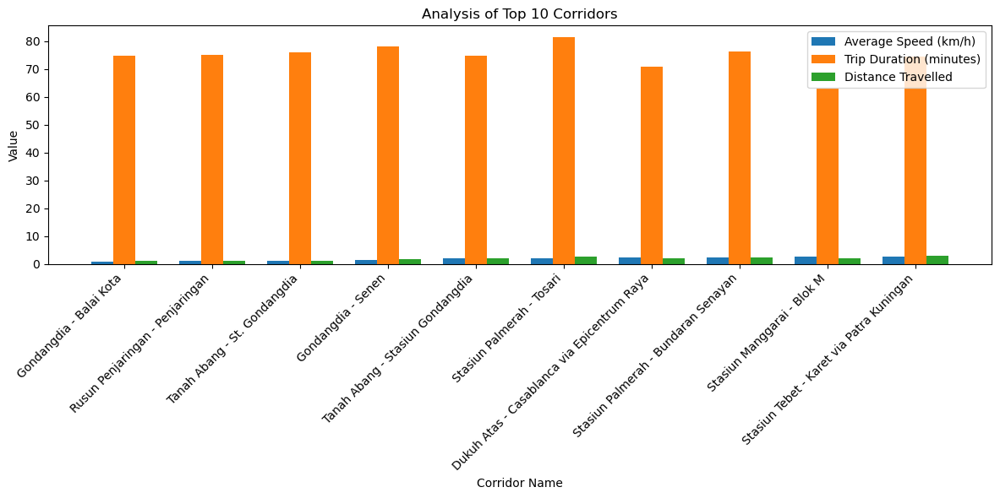

In [3976]:
import matplotlib.pyplot as plt
import numpy as np

# Data
x = np.arange(len(t10['corridorName'])) 
width = 0.25

fig, ax = plt.subplots(figsize=(12, 6))

# Bar untuk tiap metrik
ax.bar(x - width, t10['average_speed_kmh'], width, label='Average Speed (km/h)')
ax.bar(x, t10['tripDurationMinute'], width, label='Trip Duration (minutes)')
ax.bar(x + width, t10['DistanceTravelled'], width, label='Distance Travelled')

# Labeling
ax.set_xlabel('Corridor Name')
ax.set_ylabel('Value')
ax.set_title('Analysis of Top 10 Corridors')
ax.set_xticks(x)
ax.set_xticklabels(t10['corridorName'], rotation=45, ha='right')
ax.legend()

plt.tight_layout()
plt.show()


In [3978]:
kategori_jarak = bus_bensin[['kategori_jarak']]


In [3981]:
bus_bensin

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,stopEndSeq,tapOutTime,payAmount,DistanceTravelled,emission,kategori_jarak,tripDurationMinute,emisiPerHari,route,average_speed_kmh
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,...,12.0,2023-04-03 06:00:53,3500.0,5.01,108.216,Sedang,39.15,13851.648,"(-6.184631, 106.84402) -> (-6.203101, 106.85715)",7.68
1,LGXO740D2N47GZ,4885331907664776,dki,Gandi Widodo,F,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,...,21.0,2023-04-03 06:40:01,3500.0,4.03,87.048,Pendek,57.28,8965.944,"(-6.2287, 106.83302) -> (-6.217152, 106.81892)",4.22
2,DJWR385V2U57TO,4996225095064169,dki,Emong Wastuti,F,1992,R1A,Pantai Maju - Kota,0.0,B00499P,...,39.0,2023-04-03 06:50:55,3500.0,0.16,3.456,Pendek,51.82,179.712,"(-6.133132, 106.81435) -> (-6.133731, 106.81475)",0.19
3,JTUZ800U7C86EH,639099174703,flazz,Surya Wacana,F,1978,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,...,29.0,2023-04-03 06:28:16,3500.0,2.90,62.640,Pendek,43.42,2317.680,"(-6.195743, 106.93526) -> (-6.183068, 106.93194)",4.01
4,VMLO535V7F95NJ,570928206772,flazz,Embuh Mardhiyah,M,1982,12,Tanjung Priok - Pluit,0.0,P00239,...,15.0,2023-04-03 06:57:03,3500.0,17.46,377.136,Jauh,39.47,38845.008,"(-6.14965, 106.889) -> (-6.135355, 106.81143)",26.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37886,IFPF807G7R92DX,213160779285738,emoney,"R. Putri Kusumo, S.E.I",F,1997,1A,Pantai Maju - Balai Kota,0.0,B06040P,...,27.0,2023-04-09 17:44:38,3500.0,20.62,445.392,Jauh,119.23,36967.536,"(-6.093637, 106.75068) -> (-6.157368, 106.818661)",10.38
37887,UELP204M1S64QX,4068989702474318,dki,Ajimat Pradana,F,1980,4D,Pulo Gadung 2 - Kuningan,0.0,P00269,...,9.0,2023-04-04 15:38:58,3500.0,4.37,94.392,Pendek,46.45,4908.384,"(-6.193468, 106.8883) -> (-6.192238, 106.86858)",5.64
37895,ZWEC949B8Q87QG,4685818286724028395,brizzi,Kamila Mahendra,F,2004,6B,Ragunan - MH Thamrin via Semanggi,1.0,P00261,...,13.0,2023-04-21 19:55:49,3500.0,20.81,449.496,Jauh,97.20,27419.256,"(-6.196892, 106.82309) -> (-6.290967, 106.82365)",12.85
37896,YHHK837P6Y95GN,6502902290603767,dki,Titi Siregar,M,1974,9N,Pinang Ranti - Pramuka,1.0,P00064,...,2.0,2023-04-18 22:28:22,3500.0,1.16,25.056,Pendek,35.85,876.960,"(-6.290154, 106.88116) -> (-6.291075, 106.88634)",1.94


# Kesimpulan

Kami menganalisis emisi berdasarkan dua faktor utama:

**Emisi Berdasarkan Jarak**

- Analisis ini melihat hubungan antara jarak tempuh dan emisi yang dihasilkan. Secara umum, semakin jauh jarak tempuh, semakin tinggi emisi yang dihasilkan akibat konsumsi bahan bakar.

**Emisi Berdasarkan Kemacetan**

- Kemacetan memengaruhi durasi perjalanan dan meningkatkan emisi karena kendaraan menghabiskan bahan bakar tanpa peningkatan jarak tempuh. Rute dengan kecepatan rata-rata rendah dan waktu tempuh panjang cenderung menghasilkan emisi lebih besar.
Analisis kedua faktor ini memberikan gambaran menyeluruh untuk memahami kontribusi jarak dan kemacetan terhadap emisi karbon, serta menjadi dasar untuk rekomendasi perbaikan.

Berdasarkan analisis data Transjakarta, berikut adalah rangkuman kesimpulan yang relevan:

# Analisis Emisi Berdasarkan Jarak

**Faktor Emisi dan Frekuensi Perjalanan:**

- Total emisi karbon tidak hanya dipengaruhi oleh jarak tempuh, tetapi juga oleh frekuensi perjalanan harian di setiap koridor.
- Sebagai contoh, koridor Lebak Bulus - Pasar Baru via Tomang menghasilkan emisi karbon tertinggi dalam sehari. Hal ini disebabkan oleh tingginya jumlah keberangkatan harian, meskipun jarak tempuh rute tersebut relatif lebih pendek dibandingkan koridor lainnya.

**Analisis terhadap 7 Rute Transjakarta:**

- Dari 7 rute yang saat ini digunakan oleh Transjakarta (seperti 1E, 4B, 4C, 4F, 6D, 7A, dan D21), ternyata rute dengan emisi karbon harian tertinggi tidak termasuk dalam daftar tersebut.
- Fakta ini menunjukkan bahwa pemilihan 7 rute tersebut kemungkinan besar didasarkan pada faktor lain, seperti jumlah penumpang yang dilayani, kebutuhan mobilitas wilayah strategis, atau kebijakan transportasi berbasis kebutuhan lokal yang belum sepenuhnya diketahui.

**Hal Yang Perlu Ditindak Lanjut:**

- Pemilihan rute Transjakarta memerlukan kajian lebih mendalam untuk memahami bagaimana faktor seperti kebutuhan penumpang, keberlanjutan lingkungan, dan efisiensi operasional dipertimbangkan dalam pengambilan keputusan.
- Optimisasi layanan transportasi perlu diarahkan agar lebih berorientasi pada keberlanjutan, termasuk pengurangan emisi karbon dan peningkatan efisiensi operasional di rute strategis.
- Kajian lanjutan tentang rute-rute dengan tingkat emisi tinggi dapat menjadi dasar untuk rekomendasi kebijakan dan penerapan teknologi transportasi yang ramah lingkungan di masa depan.

# Analisis Emisi Berdasarkan Faktor Kemacetan

**Kecepatan Rata-Rata yang Rendah:**
   
- Mayoritas koridor menunjukkan kecepatan rata-rata yang sangat rendah, dengan nilai tertinggi hanya 2.80 km/jam (Stasiun Tebet - Karet via Patra Kuningan) dan terendah pada Gondangdia - Balai Kota sebesar 0.94 km/jam. Hal ini mengindikasikan adanya hambatan signifikan, termasuk kemacetan lalu lintas, yang menghambat efisiensi transportasi.
    
**Durasi Perjalanan Tidak Proporsional:**

- Banyak rute mencatatkan durasi perjalanan yang tinggi, antara 70-80 menit, meskipun jarak tempuhnya pendek. Sebagai contoh, Rusun Penjaringan - Penjaringan hanya menempuh jarak 1.16 km tetapi membutuhkan waktu sekitar 75 menit. Ketidakseimbangan ini menjadi salah satu indikasi bahwa kemacetan merupakan faktor utama di koridor-koridor ini.

**Kemacetan Sebagai Faktor yang Menghasilkan Emisi Tinggi:**

- Scatter plot menunjukkan bahwa waktu perjalanan yang lama pada rute dengan jarak pendek sebagian besar disebabkan oleh kemacetan lalu lintas. Kendaraan yang terjebak dalam kemacetan menghabiskan lebih banyak bahan bakar tanpa peningkatan jarak tempuh, sehingga menghasilkan emisi karbon yang lebih tinggi.
- Koridor seperti Gondangdia - Balai Kota dan Tanah Abang - Stasiun Gondangdia, yang memiliki kecepatan rata-rata rendah dan durasi tinggi, kemungkinan besar berada di area dengan volume kendaraan tinggi.


# Rekomendasi

**Berdasarkan Jarak:**
- Kami merekomendasikan rute `8`, `1`, `3`, `9`,`10`, `6H`, `5C`, `2`, `5`, dan `5D` sebagai prioritas untuk pengoperasian bus listrik, karena rute-rute ini menghasilkan emisi karbon harian tertinggi. Dengan mengalokasikan bus listrik pada rute-rute ini, pengurangan emisi dapat difokuskan pada titik-titik utama yang menjadi penyumbang emisi terbesar.

**Berdasarkan Kemacetan:**
- Kami merekomendasikan rute `2Q`, `12H`, `M1H`, `2P`, `1H`, `1B`, `6Q`, `1F`, `6M`, dan `6C` sebagai prioritas untuk pengoperasian bus listrik. Rute-rute ini dipilih karena menghasilkan emisi karbon tertinggi yang dipengaruhi oleh tingkat kemacetan yang tinggi. Dengan mengalokasikan bus listrik pada rute-rute ini, pengurangan emisi dapat difokuskan pada wilayah-wilayah yang menjadi kontributor utama emisi karbon, sehingga memberikan dampak signifikan dalam upaya menciptakan transportasi yang lebih ramah lingkungan.

**Rekomendasi Tambahan:**
- Lakukan pemantauan secara berkala untuk mengukur dampak pengurangan emisi pada rute-rute prioritas. Hal ini bertujuan untuk memastikan efektivitas operasional bus listrik dalam menekan emisi karbon. Data hasil evaluasi tersebut dapat digunakan sebagai dasar untuk perbaikan sistem dan pengembangan lebih lanjut, termasuk ekspansi penggunaan bus listrik ke rute-rute lain di masa mendatang.
- Tingkatkan infrastruktur pendukung untuk mendukung operasional bus listrik secara optimal. Ketersediaan  *charging stations* di dekat rute prioritas harus dipastikan, termasuk fasilitas pengisian daya cepat *fast charging* di lokasi strategis seperti terminal akhir, halte utama, dan depo bus, guna mempercepat proses pengisian daya selama operasional berlangsung.